# Prueba archivo netcdf

In [1]:
import os
import rioxarray
import netCDF4
import h5netcdf
from leafmap import leafmap
import leafmap.foliumap as leafmap
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import matplotlib.pyplot as plt

**Ubicación del archivo:**

C:/Users/acercompu/OneDrive - Ideam/Mi unidad/OSPA/04. Administrativo/02. Contratistas/11. ALEXANDER_MARTINEZ/Contrato_324_2024/csd_2024

**Nombre del archivo**

precipitable_water.tif

In [5]:
file = "precipitable_water.tif"

In [8]:
t = rasterio.open(file)
t.count
t.width
t.height
t.bounds
t.crs
t.indexes

<open DatasetReader name='precipitable_water.tif' mode='r'>

In [12]:
from rasterio.plot import show

BoundingBox(left=210.0, bottom=-25.25, right=360.25, top=70.0)

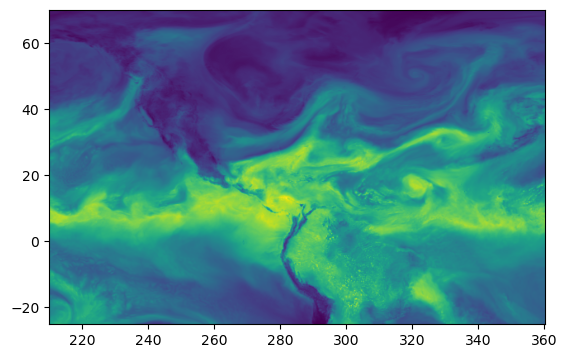

<Axes: >

In [16]:
show(t)

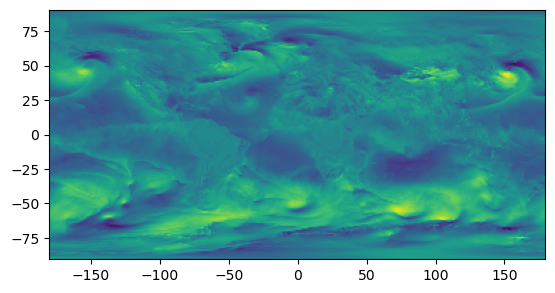

<Axes: >

In [32]:
show(w)

In [20]:
wind = "wind_global.tif"

In [22]:
w = rasterio.open(wind)
t.count
t.width
t.height
t.bounds
t.crs
t.indexes

In [34]:
w.bounds

BoundingBox(left=-180.5, bottom=-90.5, right=179.5, top=90.5)

In [33]:
t.bounds

BoundingBox(left=210.0, bottom=-25.25, right=360.25, top=70.0)

In [35]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import leafmap

In [36]:
# Nombres de los archivos de entrada y salida
input_tif = "precipitable_water.tif"
output_tif = "precipitable_water_shifted.tif"

# Abrir el archivo TIFF de entrada
with rasterio.open(input_tif) as src:
    # Obtener los metadatos del archivo de entrada
    src_meta = src.meta.copy()
    
    # Calcular la transformación y dimensiones para la longitud ajustada
    dst_transform, width, height = calculate_default_transform(
        src.crs, src.crs, src.width, src.height, 
        left=-180.5, right=179.5, top=70.0, bottom=-25.25
    )
    
    # Actualizar los metadatos con las nuevas dimensiones y transformación
    src_meta.update({
        'width': width,
        'height': height,
        'transform': dst_transform
    })
    
    # Abrir el archivo TIFF de salida
    with rasterio.open(output_tif, 'w', **src_meta) as dst:
        # Reproyectar y ajustar la longitud de los datos
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(dst, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=dst_transform,
                dst_crs=src.crs,
                resampling=Resampling.nearest
            )

In [37]:
# Visualizar el archivo TIFF de salida usando leafmap
m = leafmap.Map(center=[0, 0], zoom=2)
m.add_raster(output_tif, layer_name="Shifted Precipitable Water")
m


Map(center=[22.375, -0.5], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_o…

In [15]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import leafmap

# Definir la paleta de colores de la NASA para agua precipitable
colors = [
    (0, 0, 1),       # Azul para valores bajos
    (0, 1, 1),       # Cian
    (0, 1, 0),       # Verde
    (1, 1, 0),       # Amarillo
    (1, 0.5, 0),     # Naranja
    (1, 0, 0)        # Rojo para valores altos
]
cmap = LinearSegmentedColormap.from_list("nasa_precipitable_water", colors)

# Abrir el archivo TIFF de salida
output_tif = "precipitable_water_shifted.tif"
with rasterio.open(output_tif) as src:
    data = src.read(1)  # Leer el primer índice

    # Normalizar los datos para que estén entre 0 y 1
    data_normalized = (data - np.min(data)) / (np.max(data) - np.min(data))

    # Aplicar la paleta de colores
    colored_data = cmap(data_normalized)

    # Guardar el archivo con la paleta de colores aplicada
    profile = src.profile
    profile.update(dtype=rasterio.uint8, count=3)

    with rasterio.open("precipitable_water_colored.tif", 'w', **profile) as dst:
        for i in range(3):  # Guardar las bandas RGB
            dst.write((colored_data[:, :, i] * 255).astype(rasterio.uint8), i + 1)

# Visualizar el archivo TIFF coloreado usando leafmap
m = leafmap.Map(center=[0, 0], zoom=2)
m.add_raster("precipitable_water_colored.tif", layer_name="Colored Precipitable Water")
m


Map(center=[22.375, -0.5], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_o…

In [16]:
geojson = (
    "https://github.com/opengeos/leafmap/raw/master/examples/data/countries.geojson"
)

# Ruta al archivo TIFF coloreado
tif_file = "precipitable_water_colored.tif"

# Crear el mapa
m = leafmap.Map(center=[0, 0], zoom=2)

# Añadir el archivo TIFF coloreado
m.add_raster(tif_file, layer_name="Colored Precipitable Water")

# Añadir el shapefile de los países
m.add_geojson(geojson, layer_name="Countries")

# Mostrar el mapa
m


Map(center=[22.375, -0.5], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_o…

In [18]:
from ipyleaflet import ImageOverlay

In [19]:
# Crear el mapa
m = leafmap.Map(center=[0, 0], zoom=2)

# Ruta a la imagen
image_path = "Carta_sinoptica_20241014_1425HLC.jpg"

# Definir los límites geográficos de la imagen (ajusta estos valores según corresponda)
bounds = [[-25.25, 210.0], [70.0, 360.25]]

# Crear el overlay de la imagen
image_overlay = ImageOverlay(
    url=image_path,
    bounds=bounds,
    opacity=0.6  # Ajusta la opacidad según tus necesidades
)

# Añadir el overlay de la imagen al mapa
m.add_layer(image_overlay)

# Mostrar el mapa
m


Map(center=[0, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text'…

In [20]:
# import leafmap
# from ipyleaflet import ImageOverlay

# Crear el mapa
m = leafmap.Map(center=[0, 0], zoom=2)

# URL de una imagen de ejemplo
example_image_url = "https://www.lib.utexas.edu/maps/historical/newark_nj_1922.jpg"

# Definir los límites geográficos de la imagen de ejemplo
example_bounds = [[40.712, -74.227], [40.774, -74.125]]

# Crear el overlay de la imagen de ejemplo
example_image_overlay = ImageOverlay(
    url=example_image_url,
    bounds=example_bounds,
    opacity=0.6
)

# Añadir el overlay de la imagen de ejemplo al mapa
m.add_layer(example_image_overlay)

# Mostrar el mapa
m


Map(center=[0, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text'…

In [21]:
#import leafmap
#from ipyleaflet import ImageOverlay

# Crear el mapa
m = leafmap.Map(center=[22.375, 285.125], zoom=2)  # Ajusta el centro del mapa según sea necesario

# Ruta a la imagen local
image_path = "Carta_sinoptica_20241014_1425HLC.jpg"

# Definir los límites geográficos de la imagen (ajusta estos valores según corresponda)
bounds = [[-25.25, 210.0], [70.0, 360.25]]

# Crear el overlay de la imagen
image_overlay = ImageOverlay(
    url=image_path,
    bounds=bounds,
    opacity=1  # Ajusta la opacidad según tus necesidades
)

# Añadir el overlay de la imagen al mapa
m.add_layer(image_overlay)

# Mostrar el mapa
m


Map(center=[22.375, 285.125], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoo…


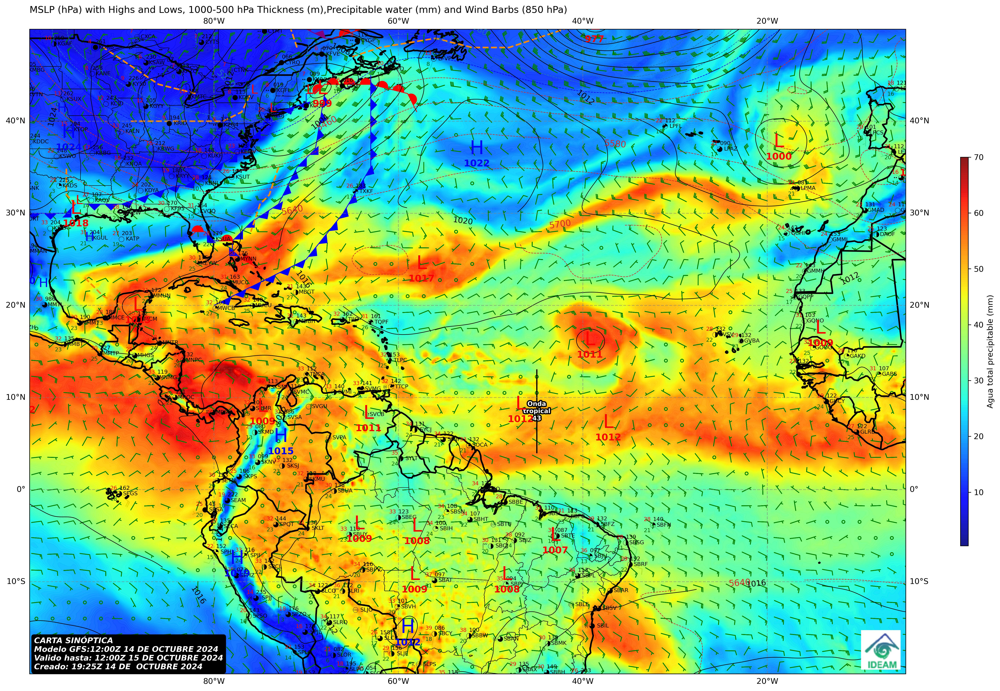

In [22]:
# import folium

# Crear el mapa centrado en las coordenadas adecuadas
m = folium.Map(location=[22.375, 285.125], zoom_start=2)

# Ruta a la imagen
image_path = "Carta_sinoptica_20241014_1425HLC.jpg"

# Definir los límites geográficos de la imagen usando los valores proporcionados
bounds = [[-25.25, 210.0], [70.0, 360.25]]

# Añadir la imagen al mapa
folium.raster_layers.ImageOverlay(
    name="Carta Sinóptica",
    image=image_path,
    bounds=bounds,
    opacity=0.6
).add_to(m)

# Añadir control de capas
folium.LayerControl().add_to(m)

# Guardar el mapa en un archivo HTML
m.save("map_with_image.html")

# Mostrar el mapa
m


In [ ]:
# !conda install -c conda-forge localtileserver

In [1]:
import os

# Instalar geemap en el entorno csd_2024 usando conda-forge
os.system('conda install -n csd_2024 -c conda-forge geemap -y')

print("La librería geemap ha sido instalada en el entorno csd_2024 usando conda-forge.")


La librería geemap ha sido instalada en el entorno csd_2024 usando conda-forge.



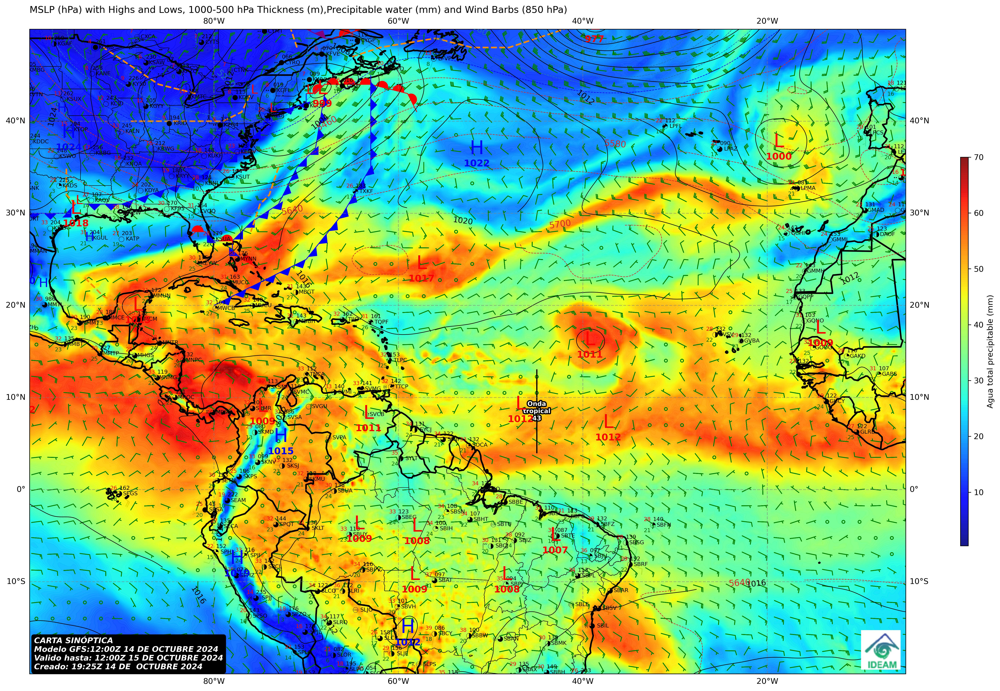

In [23]:
# import folium
import geemap.foliumap as geemap

# Crear el mapa centrado en las coordenadas adecuadas
m = geemap.Map(center=[22.375, 285.125], zoom=2)

# Ruta a la imagen
image_path = "Carta_sinoptica_20241014_1425HLC.jpg"

# Definir los límites geográficos de la imagen (ajusta estos valores según corresponda)
# Puedes empezar con estos valores y ajustarlos manualmente
bounds = [[-25.25, 210.0], [70.0, 360.25]]

# Añadir la imagen al mapa con los límites iniciales
image_overlay = folium.raster_layers.ImageOverlay(
    name="Carta Sinóptica",
    image=image_path,
    bounds=bounds,
    opacity=0.6
)
image_overlay.add_to(m)

# Añadir control de capas
folium.LayerControl().add_to(m)



# Mostrar el mapa interactivo
m



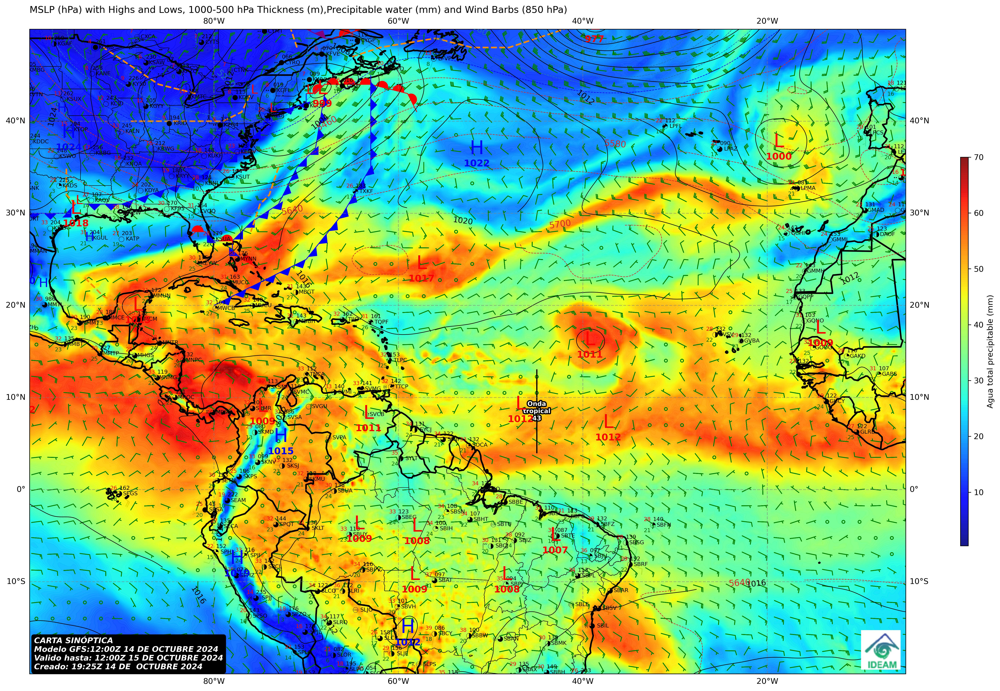
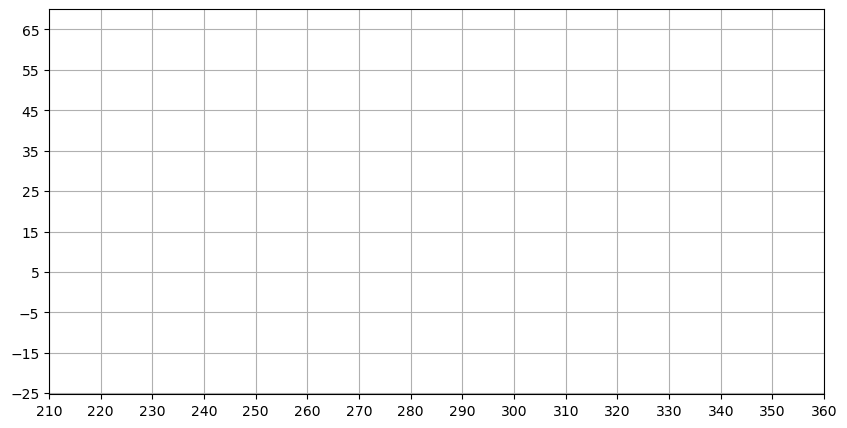

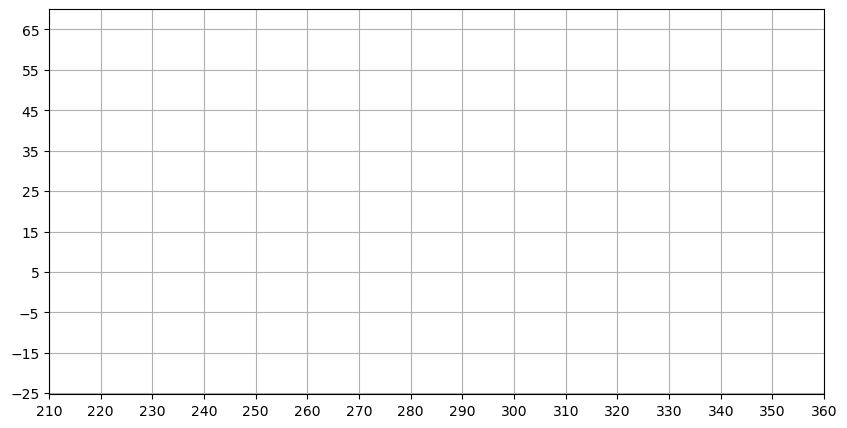

In [9]:
import folium
import matplotlib.pyplot as plt
import numpy as np
import geemap.foliumap as geemap

# Crear el mapa centrado en las coordenadas adecuadas
m = geemap.Map(center=[22.375, 285.125], zoom=2)

# Ruta a la imagen
image_path = "Carta_sinoptica_20241014_1425HLC.jpg"

# Definir los límites geográficos de la imagen (ajusta estos valores según corresponda)
bounds = [[-25.25, 210.0], [70.0, 360.25]]

# Añadir la imagen al mapa con los límites iniciales
image_overlay = folium.raster_layers.ImageOverlay(
    name="Carta Sinóptica",
    image=image_path,
    bounds=bounds,
    opacity=0.6
)
image_overlay.add_to(m)

# Crear una cuadrícula de coordenadas usando matplotlib
fig, ax = plt.subplots(figsize=(10, 5))
ax.set_xlim(210, 360)
ax.set_ylim(-25.25, 70)
ax.set_xticks(np.arange(210, 361, 10))
ax.set_yticks(np.arange(-25, 71, 10))
ax.grid(True)

# Guardar la cuadrícula como una imagen
grid_image_path = "grid_overlay.png"
plt.savefig(grid_image_path, bbox_inches='tight', transparent=True)

# Añadir la cuadrícula al mapa
grid_overlay = folium.raster_layers.ImageOverlay(
    name="Grid Overlay",
    image=grid_image_path,
    bounds=bounds,
    opacity=0.5
)
grid_overlay.add_to(m)

# Añadir control de capas
folium.LayerControl().add_to(m)

# Mostrar el mapa interactivo
m


In [ ]:
https://www.nhc.noaa.gov/tafb_latest/USA_latest.gif


In [11]:
import os

# Instalar leaflet.gridlayer en el entorno csd_2024 usando conda-forge
os.system('conda install -n csd_2024 -c conda-forge leaflet.gridlayer -y')

print("La librería leaflet.gridlayer ha sido instalada en el entorno csd_2024 usando conda-forge.")


La librería leaflet.gridlayer ha sido instalada en el entorno csd_2024 usando conda-forge.


In [15]:
import streamlit as st
from streamlit_jupyter import StreamlitPatcher, tqdm

StreamlitPatcher().jupyter()

ModuleNotFoundError: No module named 'streamlit_jupyter'

In [16]:
import leafmap
import streamlit as st

m = leafmap.Map(minimap_control=True)
m.add_basemap("OpenTopoMap")
m.to_streamlit(height=500)
# !pip install streamlit

2024-12-17 11:08:08.434 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-12-17 11:08:08.434 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


DeltaGenerator()

In [14]:
!pip install streamlit-jupyter

ERROR: Ignored the following versions that require a different python version: 0.0.3 Requires-Python >=3.8; 0.0.4 Requires-Python >=3.8; 0.1.0 Requires-Python >=3.8; 0.1.1 Requires-Python >=3.8; 0.1.10 Requires-Python >=3.8; 0.1.11 Requires-Python >=3.8; 0.1.2 Requires-Python >=3.8; 0.1.5 Requires-Python >=3.8; 0.1.6 Requires-Python >=3.8; 0.1.7 Requires-Python >=3.8; 0.1.8 Requires-Python >=3.8; 0.2.0 Requires-Python >=3.8; 0.2.1 Requires-Python >=3.8
ERROR: Could not find a version that satisfies the requirement streamlit-jupyter (from versions: none)
ERROR: No matching distribution found for streamlit-jupyter


In [13]:
m = leafmap.Map(minimap_control=True)
m.add_basemap("OpenTopoMap")
m.to_streamlit(height=500)

2024-12-17 11:05:52.248 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-12-17 11:05:52.251 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


DeltaGenerator()

In [7]:
m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…


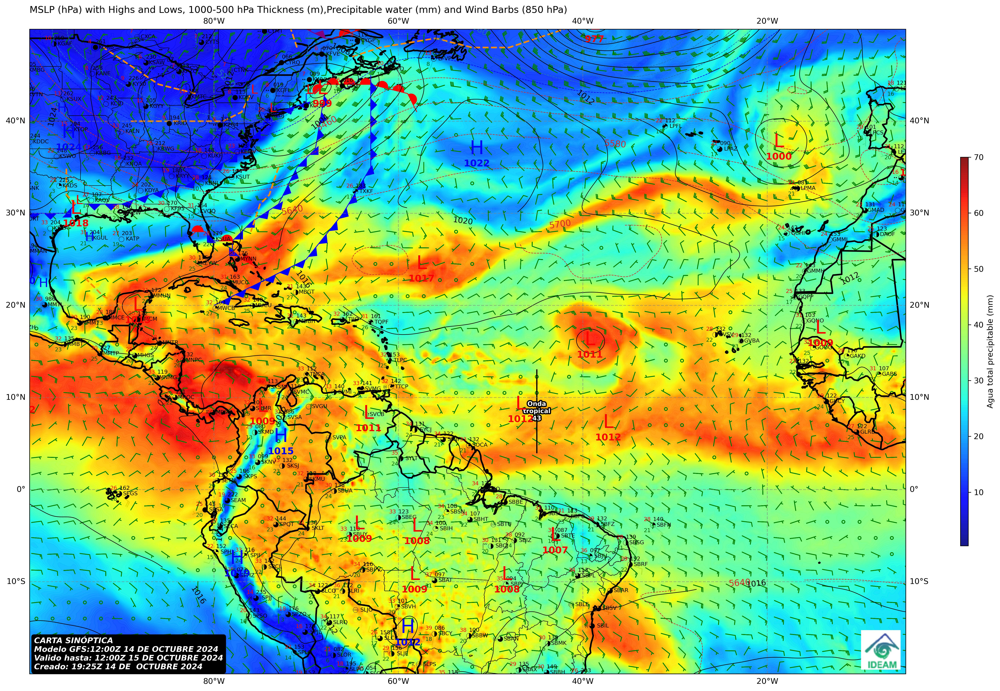

In [53]:
import folium
from folium.plugins import MousePosition

# Crear el mapa centrado en las coordenadas adecuadas
m = folium.Map(location=[22.375, 285.125], zoom_start=2)

# Añadir la imagen al mapa con los límites iniciales
image_path = "Carta_sinoptica_20241014_1425HLC.jpg"
bounds = [[-22.00, 256.55], [48.25, 365.25]]
image_overlay = folium.raster_layers.ImageOverlay(
    name="Carta Sinóptica",
    image=image_path,
    bounds=bounds,
    opacity=0.3
)
image_overlay.add_to(m)

# Añadir control de capas
folium.LayerControl().add_to(m)

# Añadir paralelos y meridianos
MousePosition().add_to(m)

# Mostrar el mapa interactivo
m


bounds = [[latitud_inferior, longitud_izquierda], [latitud_superior, longitud_derecha]]

Si la imagen está demasiado al norte, disminuye el valor de latitud_superior.
Si la imagen está demasiado al sur, aumenta el valor de latitud_inferior.
Si la imagen está demasiado al este, disminuye el valor de longitud_derecha.
Si la imagen está demasiado al oeste, aumenta el valor de longitud_izquierda.

bounds = [[-25.25, 215.0], [50.0, 355.25]]

In [61]:
from ipyleaflet import Map, basemaps, basemap_to_tiles
m = Map(
    basemap=basemap_to_tiles(basemaps.NASAGIBS.ModisTerraTrueColorCR,"2024-10-21"),
    center=(22.375, 285.125),
    zoom=2
)
m

Map(center=[22.375, 285.125], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoo…

In [74]:
import os

# Obtener el directorio actual desde el cual se inició Jupyter Lab
current_dir = os.getcwd()

# Agregar el prefijo "files/" a la ruta relativa
relative_path_with_prefix = os.path.join("files", current_dir)

print("Ruta relativa con prefijo:", relative_path_with_prefix)


Ruta relativa con prefijo: C:\Users\acercompu\OneDrive - Ideam\Mi unidad\OSPA\04. Administrativo\02. Contratistas\11. ALEXANDER_MARTINEZ\Contrato_324_2024\csd_2024


In [120]:
from PIL import Image
from IPython.display import display

# Cargar la imagen localmente
image_path = "C:/Users/acercompu/OneDrive - Ideam/Mi unidad/OSPA/04. Administrativo/02. Contratistas/11. ALEXANDER_MARTINEZ/Contrato_324_2024/csd_2024/Carta_sinoptica_20241014_1425HLC.png"

# Abre y muestra la imagen
img = Image.open(image_path)
display(img)


FileNotFoundError: [Errno 2] No such file or directory: 'C:Users\\acercompu\\OneDrive%20-%20Ideam\\Mi%20unidad\\OSPA\\04.%20Administrativo\\02.%20Contratistas\\11.%20ALEXANDER_MARTINEZ\\Contrato_324_2024\\csd_2024\\Carta_sinoptica_20241014_1425HLC.jpg'

In [107]:
import os

# Nombre de la imagen
image_name = 'Carta_sinoptica_20241014_1425HLC.jpg'

# Directorio donde se encuentra la imagen
image_dir = 'csd_2024'

# Obtener el directorio actual desde el cual se inició JupyterLab
current_dir = os.getcwd()

# Construir la ruta completa de la imagen
full_image_path = os.path.join(current_dir, image_dir, image_name)

# Construir la ruta relativa con el prefijo "files/"
relative_image_path = os.path.join('files', image_dir, image_name)

print("Ruta completa de la imagen:", full_image_path)
print("Ruta relativa con prefijo 'files/':", relative_image_path)


Ruta completa de la imagen: C:\Users\acercompu\OneDrive - Ideam\Mi unidad\OSPA\04. Administrativo\02. Contratistas\11. ALEXANDER_MARTINEZ\Contrato_324_2024\csd_2024\csd_2024\Carta_sinoptica_20241014_1425HLC.jpg
Ruta relativa con prefijo 'files/': files\csd_2024\Carta_sinoptica_20241014_1425HLC.jpg


In [101]:
current_dir

'C:\\Users\\acercompu\\OneDrive - Ideam\\Mi unidad\\OSPA\\04. Administrativo\\02. Contratistas\\11. ALEXANDER_MARTINEZ\\Contrato_324_2024\\csd_2024'

In [121]:
from ipyleaflet import Map, LocalTileLayer

# Crear un mapa centrado en una ubicación específica
m = Map(center=(25, -115), zoom=4)

# Definir la ruta relativa a la imagen con el prefijo "files/"
# image_path = 'files/http://localhost:8888/lab/tree/csd_2024/Carta_sinoptica_20241014_1425HLC.jpg'
image_path = "C:/Users/acercompu/OneDrive - Ideam/Mi unidad/OSPA/04. Administrativo/02. Contratistas/11. ALEXANDER_MARTINEZ/Contrato_324_2024/csd_2024/Carta_sinoptica_20241014_1425HLC.png"

# Crear la capa de imagen local y agregarla al mapa
tile_layer = LocalTileLayer(path=image_path)
m.add_layer(tile_layer)

# Mostrar el mapa
m


Map(center=[25, -115], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_t…

In [ ]:
-22.00, 256.55], [48.25, 365.25

In [201]:
from ipyleaflet import Map, ImageOverlay

m = Map(center=(4, -84), zoom=2, no_wrap=True)

image = ImageOverlay(
    url="https://i.imgur.com/YiqMW51.jpeg",
    # url='../06Q1fSz.png',
    bounds=((-22, 256.55), (48.25, 365.25))
)
m.add_control(LayersControl())
m.add(image);
m

Map(center=[4, -84], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_tex…

In [ ]:
import ipywidgets as widgets
from ipyleaflet import Map, ImageOverlay, LayersControl, DrawControl, FullScreenControl, WidgetControl, Marker, Popup
from IPython.display import display

In [214]:
# Crear un mapa centrado en una ubicación específica
m = Map(center=(12, -40), zoom=3, no_wrap=True)

# Definir la capa de imagen con límites ajustados y nombre
image = ImageOverlay(
    url="https://i.imgur.com/YiqMW51.jpeg",
    bounds=((-22.35, -102.9), (48.0, 4.95)),  # Ajusta los límites según sea necesario
    name="Carta Sinóptica",  # Nombre de la capa
    opacity=0.5  # Opacidad inicial
)

# Agregar control de capas para activar/desactivar la imagen
m.add_control(LayersControl())


# Agregar la capa de imagen al mapa
m.add(image)


opacity_slider = widgets.FloatSlider(
    description='Opacidad:',
    min=0,
    max=1,
    step=0.1,
    value=0.5  # Opacidad inicial
)

# Crear control de dibujo
draw_control = DrawControl()

# Conectar widgets con la función de actualización
# color_picker.observe(update_draw_control, names='value')
# thickness_slider.observe(update_draw_control, names='value')

# Inicializar las opciones de dibujo
update_draw_control(None)

# Función para actualizar la opacidad de la imagen
def update_image_opacity(change):
    image.opacity = opacity_slider.value

# Conectar el slider de opacidad con la función de actualización
opacity_slider.observe(update_image_opacity, names='value')

# Agregar control de dibujo al mapa
m.add_control(draw_control)

# Agregar control de pantalla completa
fullscreen_control = FullScreenControl()
m.add_control(fullscreen_control)

# Crear un contenedor para los widgets
widget_box = widgets.VBox([opacity_slider])

# Agregar el contenedor de widgets al mapa como un control de widget
widget_control = WidgetControl(widget=widget_box, position='topright')
m.add_control(widget_control)



# Agregar un marcador para la ubicación del texto
# marker = Marker(location=(4, -74))
# marker.on_click(add_text)
# m.add_layer(marker)

# Mostrar el mapa
m


Map(center=[12, -40], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_te…

In [221]:
import ipywidgets as widgets
from ipyleaflet import Map, DrawControl, LayersControl, FullScreenControl, WidgetControl
from IPython.display import display

# Crear un mapa centrado en una ubicación específica
m = Map(center=(40, -100), zoom=4, no_wrap=True)

# Agregar control de capas para activar/desactivar la imagen
m.add_control(LayersControl())

# Crear widgets para seleccionar color y grosor
color_picker = widgets.ColorPicker(
    description='Color:',
    value='#0000ff'  # Color inicial (azul para frentes fríos)
)
thickness_slider = widgets.IntSlider(
    description='Grosor:',
    min=1,
    max=10,
    value=3  # Grosor inicial
)

# Crear control de dibujo
draw_control = DrawControl()

# Función para actualizar las opciones de dibujo
def update_draw_control(change):
    draw_control.polyline = {
        "shapeOptions": {
            "color": color_picker.value,
            "weight": thickness_slider.value,
            "opacity": 0.8
        }
    }

# Conectar widgets con la función de actualización
color_picker.observe(update_draw_control, names='value')
thickness_slider.observe(update_draw_control, names='value')

# Inicializar las opciones de dibujo
update_draw_control(None)

# Agregar control de dibujo al mapa
m.add_control(draw_control)

# Agregar control de pantalla completa
fullscreen_control = FullScreenControl()
m.add_control(fullscreen_control)

# Crear un contenedor para los widgets
widget_box = widgets.VBox([color_picker, thickness_slider])

# Agregar el contenedor de widgets al mapa como un control de widget
widget_control = WidgetControl(widget=widget_box, position='topright')
m.add_control(widget_control)

# Mostrar el mapa
m


Map(center=[40, -100], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_t…

In [233]:
from ipyleaflet import Map, DrawControl, LayerGroup, Polyline, WidgetControl
from ipywidgets import Dropdown, VBox

# Crear el mapa interactivo
m = Map(center=(25, -115), zoom=4)

# Capa para almacenar los frentes
frente_layer = LayerGroup()
m.add_layer(frente_layer)

# Control de dibujo para dibujar polilíneas
draw_control = DrawControl(
    polyline={"shapeOptions": {"color": "#3388ff", "weight": 5}},
    marker={},
    circlemarker={},
    circle={},
    rectangle={},
    polygon={}
)

# Dropdown para seleccionar el tipo de frente
frente_dropdown = Dropdown(
    options=['Frente Frio', 'Frente Calido', 'Frente Ocluido', 'Frente Estacionario'],
    value='Frente Frio',
    description='Tipo de Frente:',
)

# Función que se ejecuta al dibujar una polilínea
def handle_draw(event, action, geo_json):
    if action == 'created':
        geometry = geo_json['geometry']
        
        if geometry['type'] == 'LineString':
            coords = geometry['coordinates']
            
            # Seleccionar color basado en el tipo de frente
            if frente_dropdown.value == 'Frente Frio':
                color = 'blue'
            elif frente_dropdown.value == 'Frente Calido':
                color = 'red'
            elif frente_dropdown.value == 'Frente Ocluido':
                color = 'purple'
            elif frente_dropdown.value == 'Frente Estacionario':
                color = 'green'
            
            # Dibujar la polilínea en el mapa con el color correspondiente
            polyline = Polyline(
                locations=[(c[1], c[0]) for c in coords], 
                color=color,
                weight=4
            )
            frente_layer.add_layer(polyline)
            print(f"{frente_dropdown.value} dibujado.")

# Asignar el manejador de eventos al control de dibujo
draw_control.on_draw(handle_draw)

# Añadir el control de dibujo y el menú desplegable al mapa
m.add_control(draw_control)

# Añadir el menú desplegable para seleccionar el tipo de frente
widget_control = WidgetControl(widget=frente_dropdown, position='topright')
m.add_control(widget_control)

# Mostrar el mapa
m


Map(center=[25, -115], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_t…

In [245]:
# Ejemplo de coordenadas que representan un frente frío
cold_front_coordinates = [
    (30, -100), (31, -99), (30.5, -98.5), (31, -98), 
    (30.5, -97.5), (31, -97), (30, -96), (29, -97), 
    (29.5, -98), (30, -99)
]


In [246]:
from ipyleaflet import Map, Polyline

# Crear el mapa
m = Map(center=(30, -98), zoom=5)

# Crear la polilínea para el frente frío
cold_front = Polyline(locations=cold_front_coordinates, color='blue', fill=True)

# Agregar la polilínea al mapa
m.add_layer(cold_front)

# Mostrar el mapa
m


Map(center=[30, -98], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_te…

In [247]:
def generate_cold_front_shape(start, end, num_triangles=5):
    """Genera un conjunto de coordenadas para un frente frío."""
    # Línea principal entre start y end
    line = [start, end]

    # Generar triángulos (pips) a lo largo de la línea
    triangles = []
    for i in range(num_triangles):
        # Calcular posición del triángulo
        fraction = (i + 1) / (num_triangles + 1)
        # Interpolar entre start y end
        mid_point = (
            start[0] * (1 - fraction) + end[0] * fraction,
            start[1] * (1 - fraction) + end[1] * fraction
        )
        # Triángulo apuntando hacia abajo (frente frío)
        triangles.append([
            (mid_point[0], mid_point[1] + 0.1),  # Vértice superior
            (mid_point[0] - 0.1, mid_point[1] - 0.1),  # Vértice inferior izquierdo
            (mid_point[0] + 0.1, mid_point[1] - 0.1)   # Vértice inferior derecho
        ])
    return line, triangles


In [248]:
from ipyleaflet import Map, Polyline, Polygon

# Crear el mapa
m = Map(center=(30, -98), zoom=5)

# Definir los puntos iniciales y finales del frente frío
start_point = (30, -100)
end_point = (30, -95)

# Generar la forma del frente frío
line, triangles = generate_cold_front_shape(start_point, end_point)

# Dibujar la línea del frente frío
cold_front_line = Polyline(locations=line, color='blue', weight=3)
m.add_layer(cold_front_line)

# Dibujar los triángulos (pips) del frente frío
for triangle in triangles:
    cold_front_triangle = Polygon(locations=triangle, color='blue', fill=True)
    m.add_layer(cold_front_triangle)

# Mostrar el mapa
m


Map(center=[30, -98], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_te…

In [253]:
def generate_cold_front_shape_with_segments(start, end, num_segments=5):
    """Genera un conjunto de coordenadas para un frente frío con segmentos de línea y triángulos."""
    # Generar puntos a lo largo de la línea
    points = []
    for i in range(num_segments + 1):
        fraction = i / num_segments
        point = (
            start[0] * (1 - fraction) + end[0] * fraction,
            start[1] * (1 - fraction) + end[1] * fraction
        )
        points.append(point)

    # Crear líneas y triángulos
    shapes = []
    for i in range(num_segments):
        # Línea
        line = [points[i], points[i + 1]]
        shapes.append(('line', line))

        # Triángulo apuntando hacia abajo (frente frío)
        mid_point = points[i + 1]  # Usar el punto final del segmento
        triangle = [
            (mid_point[0], mid_point[1] - 0.05),  # Vértice inferior (base sobre la línea)
            (mid_point[0] - 0.05, mid_point[1] + 0.05),  # Vértice superior izquierdo
            (mid_point[0] + 0.05, mid_point[1] + 0.05)   # Vértice superior derecho
        ]
        shapes.append(('triangle', triangle))

    return shapes


In [254]:
from ipyleaflet import Map, Polyline, Polygon

# Crear el mapa
m = Map(center=(30, -98), zoom=5)

# Definir los puntos iniciales y finales del frente frío
start_point = (30, -100)
end_point = (30, -95)

# Generar la forma del frente frío
shapes = generate_cold_front_shape_with_segments(start_point, end_point, num_segments=5)

# Dibujar los segmentos en el mapa
for shape_type, shape in shapes:
    if shape_type == 'line':
        cold_front_line = Polyline(locations=shape, color='blue', weight=3)
        m.add_layer(cold_front_line)
    elif shape_type == 'triangle':
        cold_front_triangle = Polygon(locations=shape, color='blue', fill=True)
        m.add_layer(cold_front_triangle)

# Mostrar el mapa
m


Map(center=[30, -98], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_te…

In [255]:
from ipyleaflet import Map, Polygon

# Crear el mapa
m = Map(center=(30, -98), zoom=5)

# Definir las coordenadas del triángulo
# El vértice inferior (base sobre la línea) y los vértices superiores
triangle_coords = [
    (30, -98),  # Vértice inferior (base)
    (30 - 0.05, -98 + 0.05),  # Vértice superior izquierdo
    (30 + 0.05, -98 + 0.05)   # Vértice superior derecho
]

# Crear y añadir el triángulo al mapa
cold_front_triangle = Polygon(locations=triangle_coords, color='blue', fill=True)
m.add_layer(cold_front_triangle)

# Mostrar el mapa
m


Map(center=[30, -98], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_te…

In [260]:
from ipyleaflet import Map, Polygon, Polyline

# Crear el mapa
m = Map(center=(30, -98), zoom=5)

# Definir las coordenadas del triángulo giradas 90 grados a la izquierda (hacia el oeste)
triangle_coords = [
    (30, -98 + 0.05 * 30),          # Vértice inferior derecho
    (30 - 1.5, -98 + 0.00 * 30),    # Vértice superior (apuntando hacia el oeste)
    (30, -98 - 0.05 * 30)           # Vértice inferior izquierdo
]

# Crear y añadir el triángulo al mapa
cold_front_triangle = Polygon(locations=triangle_coords, color='blue', fill=True)
m.add_layer(cold_front_triangle)

# Definir las coordenadas de la línea que toca la base del triángulo
line_coords = [
    (30, -98 - 0.10 * 30),  # Extendido hacia abajo
    (30, -98 + 0.10 * 30)   # Extendido hacia arriba
]

# Crear y añadir la línea al mapa
line = Polyline(locations=line_coords, color='red', weight=2)
m.add_layer(line)

# Mostrar el mapa
m


Map(center=[30, -98], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_te…

In [ ]:
triangle_coords = [
    (30, -98 + 0.05 * 30),          # Vértice inferior derecho
    (30 - 1.5, -98 + 0.00 * 30),    # Vértice superior (apuntando hacia el oeste)
    (30, -98 - 0.05 * 30)           # Vértice inferior izquierdo
]


In [270]:
from ipyleaflet import Map, DrawControl, LayerGroup, Polygon, Polyline

# Crear un mapa centrado en una ubicación específica
center = (52.204793, 360.121558)
m = Map(center=center, zoom=10)

# Crear un grupo de capas para añadir las figuras
layer_group = LayerGroup()
m.add_layer(layer_group)

# Definir una función para dibujar el triángulo y la línea
def draw_custom_shape(action, geo_json):
    # Obtener la ubicación del clic
    lat, lng = geo_json['geometry']['coordinates'][0][0]

    # Definir las coordenadas del triángulo equilátero basado en la ubicación del clic
    triangle_coordinates = [
        (lat, lng),               # Vértice superior
        (lat - 0.005, lng + 0.005),  # Vértice inferior derecho
        (lat - 0.005, lng - 0.005)   # Vértice inferior izquierdo
    ]

    # Crear el polígono del triángulo
    triangle = Polygon(
        locations=triangle_coordinates,
        color="blue",       # Color del borde
        fill_color="blue",  # Color de relleno
        fill_opacity=0.5    # Opacidad del relleno
    )

    # Definir las coordenadas de la línea superpuesta que sobrepase la base
    line_coordinates = [
        (lat - 0.005, lng - 0.01),  # Extremo izquierdo extendido
        (lat - 0.005, lng + 0.01)   # Extremo derecho extendido
    ]

    # Crear la línea superpuesta
    line = Polyline(
        locations=line_coordinates,
        color="red",  # Color de la línea
        weight=3      # Grosor de la línea
    )

    # Añadir el triángulo y la línea al grupo de capas
    layer_group.add_layer(triangle)
    layer_group.add_layer(line)

# Crear una instancia de DrawControl
draw_control = DrawControl()

# Configurar las opciones de dibujo para permitir dibujar otras figuras
draw_control.polyline = {
    "shapeOptions": {
        "color": "#ff7800",
        "weight": 5,
        "opacity": 0.7
    }
}
draw_control.polygon = {
    "shapeOptions": {
        "fillColor": "#6be5c3",
        "color": "#6be5c3",
        "fillOpacity": 0.5
    }
}
draw_control.circle = {
    "shapeOptions": {
        "fillColor": "#efed69",
        "color": "#efed69",
        "fillOpacity": 0.5
    }
}

# Añadir un evento para dibujar la figura personalizada
draw_control.on_draw(draw_custom_shape)

# Añadir el control de dibujo al mapa
m.add_control(draw_control)

# Mostrar el mapa
m


Map(center=[52.204793, 360.121558], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title'…

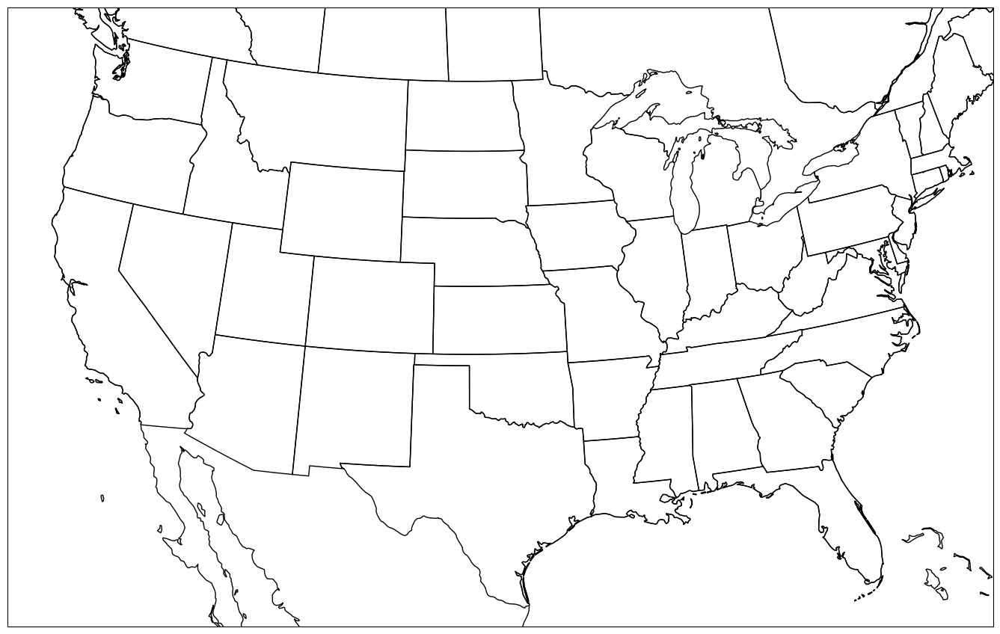

In [282]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from metpy.plots import ColdFront, WarmFront, OccludedFront, StationaryFront

# Esta es la parte del código para dibujar frentes frios
def onclick(event):
    if event.button == 3:
        x.append(event.xdata)
        y.append(event.ydata)
        if len(ax.lines) > 0:
            ax.lines[0].remove()
        ax.plot(x, y, 'blue', path_effects=[ColdFront(size=8, spacing=1.5)])
        plt.draw()


x = []
y = []
###########################################

crs = ccrs.LambertConformal(central_longitude=-100, central_latitude=45)
bounds = [(-122, -75, 25, 50)]

fig = plt.figure(figsize=(17,12))
ax = fig.add_subplot(1,1,1, projection=crs)
ax.set_extent(*bounds, crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.STATES)

# Esta es la otra parte del código para dibujar frentes frios - canvas
cid = fig.canvas.mpl_connect('button_press_event', onclick)
#####################################################

plt.show()

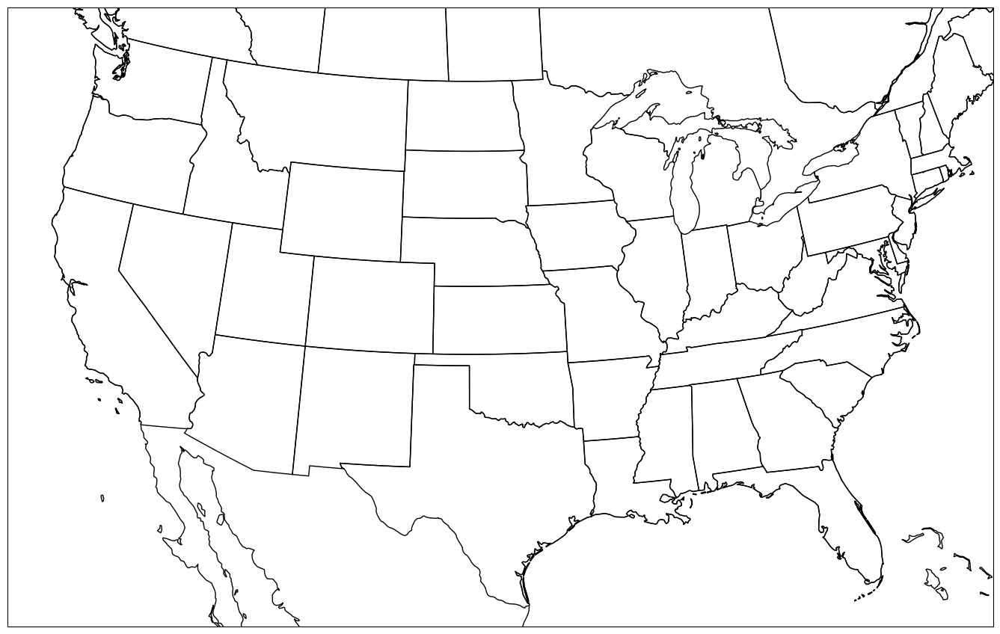

In [283]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from metpy.plots import ColdFront, WarmFront, OccludedFront, StationaryFront
import matplotlib.patheffects as PathEffects

# Esta es la parte del código para dibujar frentes frios
def onclick(event):
    if event.button == 3:
        x.append(event.xdata)
        y.append(event.ydata)
        if len(ax.lines) > 0:
            ax.lines[0].remove()
        ax.plot(x, y, 'blue', path_effects=[ColdFront(size=8, spacing=1.5)])
        plt.draw()

x = []
y = []

###########################################

crs = ccrs.LambertConformal(central_longitude=-100, central_latitude=45)
bounds = [-122, -75, 25, 50]

fig = plt.figure(figsize=(17, 12))
ax = fig.add_subplot(1, 1, 1, projection=crs)
ax.set_extent(bounds, crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.STATES)

# Esta es la otra parte del código para dibujar frentes frios - canvas
cid = fig.canvas.mpl_connect('button_press_event', onclick)
#####################################################

plt.show()


In [284]:
%matplotlib widget

RuntimeError: 'widget is not a recognised GUI loop or backend name

# [Ayudas Ipyleaflet](https://blog.jupyter.org/interactive-gis-in-jupyter-with-ipyleaflet-52f9657fa7a)

# [Ejemplos en Jupyter notebook](https://notebooks.gesis.org/binder/jupyter/user/jupyter-widgets-ipyleaflet-kuvg8z7l/tree/examples)

# [Streamlit](https://github.com/opengeos/streamlit-geospatial)

# [How to build a custom Leaflet Control](https://youtu.be/kAwrqQDwVq0)

# [Matplotlib con mplleaflet](https://youtu.be/IL9lVuAebzk)

# [Drawing Fronts and Boundaries with Path Effects](https://youtu.be/VXUXqoLky5Q)

In [2]:
import matplotlib.pyplot as plt
import numpy as np

In [3]:
from metpy.plots import (ColdFront, WarmFront, ScallopedStroke, ColdFrontogenesis, ColdFrontolysis,
                         Dryline, WarmFrontogenesis, WarmFrontolysis, OccludedFront, OccludedFrontogenesis,
                         OccludedFrontolysis, RidgeAxis, Squall, StationaryFront, StationaryFrontogenesis,
                         StationaryFrontolysis)

In [4]:
effects = [ColdFront, WarmFront, ScallopedStroke, ColdFrontogenesis, ColdFrontolysis,
                         Dryline, WarmFrontogenesis, WarmFrontolysis, OccludedFront, OccludedFrontogenesis,
                         OccludedFrontolysis, RidgeAxis, Squall, StationaryFront, StationaryFrontogenesis,
                         StationaryFrontolysis]

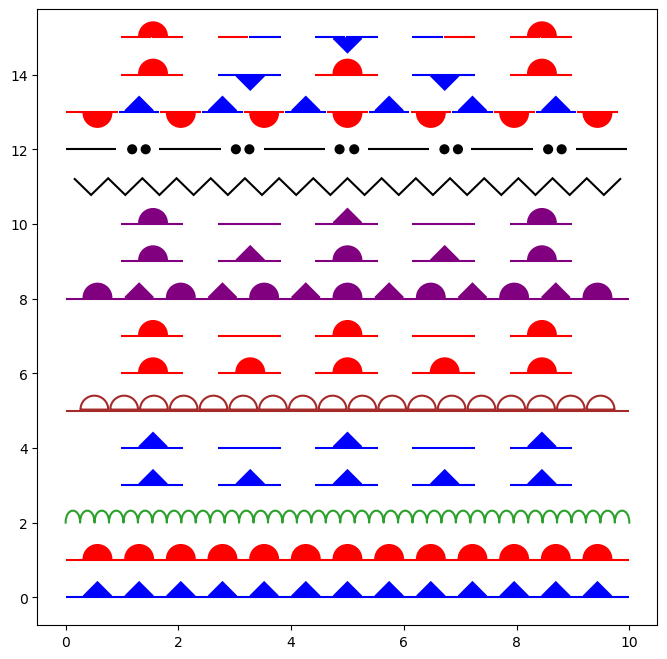

In [5]:
x = np.array([0,10])
y = np.array([1,1])

fig, ax = plt.subplots(figsize=(8,8))
for i, effect in enumerate(effects):
    ax.plot(x, y * i, path_effects = [effect()])

In [78]:
!jupyter labextension list

JupyterLab v4.2.5
C:\Users\acercompu\anaconda3\envs\csd_2024\share\jupyter\labextensions
        anywidget v0.9.13 enabled ok
        bqplot v0.5.44 enabled  X (python, bqplot)
        ipyevents v2.0.1 enabled ok
        ipysheet v0.7.0 enabled  X (python, ipysheet)
        ipytree v0.2.2 enabled ok
        jupyter-leaflet v0.19.2 enabled ok
        jupyter-vue v1.11.0 enabled ok
        jupyter-vuetify v1.10.0 enabled ok
        jupyterlab-plotly v5.24.1 enabled  X
        jupyterlab_pygments v0.3.0 enabled ok (python, jupyterlab_pygments)
        @jupyter-widgets/jupyterlab-manager v5.0.13 enabled ok (python, jupyterlab_widgets)


   The following extensions may be outdated or specify dependencies that are incompatible with the current version of jupyterlab:
        bqplot
        ipysheet
        jupyterlab-plotly
        
   If you are a user, check if an update is available for these packages.
   If you are a developer, re-run with `--verbose` flag for more details.

Other labexte

In [79]:
import os

# Actualizar bqplot, ipysheet y jupyterlab-plotly
os.system('conda update -c conda-forge bqplot ipysheet jupyterlab-plotly -y')

# import os

# Reinstalar las extensiones de JupyterLab
os.system('jupyter labextension install @jupyter-widgets/jupyterlab-manager')
os.system('jupyter labextension install jupyter-leaflet')



1

In [70]:
import os

# Instalar ipyleaflet y Pillow usando conda
os.system('conda install -c conda-forge ipyleaflet pillow -y')

# Instalar y habilitar las extensiones de JupyterLab necesarias
os.system('conda install -c conda-forge nodejs -y')
os.system('jupyter labextension install @jupyter-widgets/jupyterlab-manager')
os.system('jupyter labextension install jupyter-leaflet')


1

In [53]:
import ee
import geemap

In [54]:
ee.Authenticate()

True

In [55]:
ee.Initialize(project='my-project')

EEException: Caller does not have required permission to use project my-project. Grant the caller the roles/serviceusage.serviceUsageConsumer role, or a custom role with the serviceusage.services.use permission, by visiting https://console.developers.google.com/iam-admin/iam/project?project=my-project and then retry. Propagation of the new permission may take a few minutes.

In [50]:
geemap.ee_search()

EEException: Earth Engine client library not initialized. See http://goo.gle/ee-auth.

In [23]:
pwd

'C:\\Users\\acercompu\\OneDrive - Ideam\\Mi unidad\\OSPA\\04. Administrativo\\02. Contratistas\\11. ALEXANDER_MARTINEZ\\Contrato_324_2024\\csd_2024'

In [33]:
import os

# Instalar Pillow y Matplotlib usando conda
os.system('conda install -c conda-forge pillow matplotlib -y')


0

In [42]:
import os
from ipyleaflet import Map, ImageOverlay, DrawControl
from PIL import Image, ImageDraw
from IPython.display import display

In [43]:
# Ruta de la imagen meteorológica
image_path = 'Carta_sinoptica_20241014_1425HLC.png'

In [44]:
# Cargar la imagen
image = Image.open(image_path)
draw = ImageDraw.Draw(image)

In [45]:
# Crear el mapa
m = Map(center=(0, 0), zoom=2)

# Crear una superposición de imagen
image_overlay = ImageOverlay(
    url=image_path,
    bounds=((0, 0), (10, 10))
)
m.add_layer(image_overlay)

In [41]:
# Crear una superposición de imagen
image_overlay = ImageOverlay(
    url=image_path,
    bounds=((0, 0), (10, 10))
)
m.add_layer(image_overlay)

# Crear un controlador de dibujo
draw_control = DrawControl()

In [46]:
# Crear un controlador de dibujo
draw_control = DrawControl()


In [47]:
draw_control = DrawControl()

# Función para manejar los eventos de dibujo
def handle_draw(target, action, geo_json):
    if action == 'created':
        coords = geo_json['geometry']['coordinates'][0]
        for coord in coords:
            x, y = coord
            # Dibujar un círculo en la posición del clic
            draw.ellipse((x-5, y-5, x+5, y+5), fill=(255, 0, 0))
        # Actualizar la imagen en la superposición
        image.save(image_path)
        image_overlay.url = image_path

draw_control.on_draw(handle_draw)
m.add_control(draw_control)

display(m)


Map(center=[0, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text'…

In [219]:
from ipyleaflet import Map, basemaps, WidgetControl
from ipywidgets import IntSlider, ColorPicker, jslink

m = Map(center=(46.01, 6.16), zoom=12, basemap=basemaps.Stadia.StamenTerrain)
zoom_slider = IntSlider(description='Zoom level:', min=0, max=15, value=7)
jslink((zoom_slider, 'value'), (m, 'zoom'))
widget_control1 = WidgetControl(widget=zoom_slider, position='topright')
m.add(widget_control1)

color_picker = ColorPicker(description='Pick a color:')
widget_control2 = WidgetControl(widget=color_picker, position='bottomright')
m.add(widget_control2)

# Agregar control de dibujo al mapa
m.add_control(draw_control)

m

Map(center=[46.01, 6.16], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_ou…

In [218]:
from ipyleaflet import Map, LegendControl

m = Map(center=(-10,-45), zoom=4)

legend = LegendControl({"low":"#FAA", "medium":"#A55", "High":"#500"}, title="Legend", position="bottomright")
m.add(legend)

# Agregar control de dibujo al mapa
m.add_control(draw_control)

# Añadir control de capas
m.add_control(LayersControl())


m

Map(center=[-10, -45], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_t…

In [220]:
import json
import os
import requests

from ipyleaflet import AwesomeIcon, GeoJSON, Map, Marker, LayerGroup, SearchControl

m = Map(zoom=3, center=[19.1646, 72.8493])

if not os.path.exists('countries.geo.json'):
      url = 'https://raw.githubusercontent.com/jupyter-widgets/ipyleaflet/master/examples/countries.geo.json'
      r = requests.get(url)
      with open('countries.geo.json', 'w') as f:
        f.write(r.content.decode("utf-8"))

with open("countries.geo.json") as f:
    data = json.load(f)

countries = GeoJSON(data=data)

layer_group = LayerGroup(layers=(countries,))
marker = Marker(icon=AwesomeIcon(name="check", marker_color='green', icon_color='darkred'))

m.add(SearchControl(
  position="topleft",
  layer=layer_group,
  zoom=4,
  property_name='name',
  marker=marker
))

m

Map(center=[19.1646, 72.8493], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zo…

In [ ]:
# Crear widgets para seleccionar color, grosor y opacidad
color_picker = widgets.ColorPicker(
    description='Color:',
    value='#ff0000'  # Color inicial
)
thickness_slider = widgets.IntSlider(
    description='Grosor:',
    min=1,
    max=10,
    value=5  # Grosor inicial
)

# Función para agregar texto al mapa
def add_text(marker, **kwargs):
    text = widgets.Text(
        value='',
        placeholder='Escribe algo...',
        description='Texto:',
        disabled=False
    )
    button = widgets.Button(description="Agregar")
    
    def on_button_clicked(b):
        popup = Popup(
            location=marker.location,
            child=widgets.HTML(value=text.value),
            close_button=False,
            auto_close=False,
            close_on_escape_key=False
        )
        m.add_layer(popup)
    
    button.on_click(on_button_clicked)
    
    display(widgets.VBox([text, button]))


# Función para actualizar las opciones de dibujo
def update_draw_control(change):
    draw_control.polyline = {
        "shapeOptions": {
            "color": color_picker.value,
            "weight": thickness_slider.value,
            "opacity": 0.8
        }
    }
    draw_control.polygon = {
        "shapeOptions": {
            "color": color_picker.value,
            "weight": thickness_slider.value,
            "opacity": 0.8
        }
    }
    draw_control.rectangle = {
        "shapeOptions": {
            "color": color_picker.value,
            "weight": thickness_slider.value,
            "opacity": 0.8
        }
    }

In [193]:
import ipywidgets as widgets
from ipyleaflet import Map, ImageOverlay, LayersControl, DrawControl, FullScreenControl, WidgetControl, Marker, Popup
from IPython.display import display

# Crear un mapa centrado en una ubicación específica
m = Map(center=(4, -74), zoom=2, no_wrap=True)

# Definir la capa de imagen con límites ajustados y nombre
image = ImageOverlay(
    url="https://i.imgur.com/YiqMW51.jpeg",
    bounds=((-22.35, -102.9), (48.0, 4.95)),  # Ajusta los límites según sea necesario
    name="Carta Sinóptica",  # Nombre de la capa
    opacity=0.5  # Opacidad inicial
)

# Agregar control de capas para activar/desactivar la imagen
m.add_control(LayersControl())

# Agregar la capa de imagen al mapa
m.add(image)
m.add_layer(marker)

# Mostrar el mapa
m


Map(center=[4, -74], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_tex…

In [ ]:
https://imgur.com/YiqMW51

In [99]:
!conda list

# packages in environment at C:\Users\acercompu\anaconda3\envs\csd_2024:
#
# Name                    Version                   Build  Channel
_openmp_mutex             4.5                       2_gnu    conda-forge
affine                    2.4.0              pyhd8ed1ab_0    conda-forge
aiohappyeyeballs          2.4.3              pyhd8ed1ab_0    conda-forge
aiohttp                   3.10.10         py311h5082efb_0    conda-forge
aiosignal                 1.3.1              pyhd8ed1ab_0    conda-forge
aniso8601                 9.0.1              pyhd8ed1ab_0    conda-forge
annotated-types           0.7.0              pyhd8ed1ab_0    conda-forge
anyio                     4.6.2.post1        pyhd8ed1ab_0    conda-forge
anywidget                 0.9.13             pyhd8ed1ab_0    conda-forge
aom                       3.9.1                he0c23c2_0    conda-forge
argon2-cffi               23.1.0             pyhd8ed1ab_0    conda-forge
argon2-cffi-bindings      21.2.0          py311he736701

In [222]:
install_command = "conda install -c conda-forge metpy -y"
os.system(install_command)

0

In [230]:
import ipywidgets as widgets
from ipyleaflet import Map, Polyline, LayersControl, FullScreenControl, WidgetControl, DrawControl
from metpy.plots import ColdFront, WarmFront, StationaryFront, OccludedFront
import numpy as np

# Crear un mapa centrado en una ubicación específica
m = Map(center=(40, -100), zoom=4, no_wrap=True)

# Agregar control de capas para activar/desactivar la imagen
m.add_control(LayersControl())

# Crear widgets para seleccionar el tipo de frente y el color
front_type = widgets.Dropdown(
    options=['Cold Front', 'Warm Front', 'Stationary Front', 'Occluded Front'],
    description='Tipo de Frente:'
)
color_picker = widgets.ColorPicker(
    description='Color:',
    value='#0000ff'  # Color inicial (azul para frentes fríos)
)

# Crear control de dibujo
draw_control = DrawControl()

# Lista para almacenar las coordenadas de los puntos clicados
clicked_points = []

# Función para manejar los clics en el mapa
def handle_draw(action, geo_json):
    if action == 'created':
        coordinates = geo_json['geometry']['coordinates']
        clicked_points.append((coordinates[1], coordinates[0]))  # Almacenar como (lat, lon)
        
        # Dibujar el frente si hay suficientes puntos
        if len(clicked_points) > 1:
            lats, lons = zip(*clicked_points)
            if front_type.value == 'Cold Front':
                front = ColdFront(lats, lons)
            elif front_type.value == 'Warm Front':
                front = WarmFront(lats, lons)
            elif front_type.value == 'Stationary Front':
                front = StationaryFront(lats, lons)
            elif front_type.value == 'Occluded Front':
                front = OccludedFront(lats, lons)
            
            # Dibujar el frente en el mapa
            polyline = Polyline(
                locations=list(zip(front.lats, front.lons)),
                color=color_picker.value,
                weight=5,
                opacity=0.8
            )
            m.add_layer(polyline)
            clicked_points.clear()  # Limpiar la lista de puntos clicados

# Conectar el control de dibujo con la función de manejo de clics
draw_control.on_draw(handle_draw)

# Agregar control de dibujo al mapa
m.add_control(draw_control)

# Agregar control de pantalla completa
fullscreen_control = FullScreenControl()
m.add_control(fullscreen_control)

# Crear un contenedor para los widgets
widget_box = widgets.VBox([front_type, color_picker])

# Agregar el contenedor de widgets al mapa como un control de widget
widget_control = WidgetControl(widget=widget_box, position='topright')
m.add_control(widget_control)

# Mostrar el mapa
m


Map(center=[40, -100], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_t…

In [97]:
from ipyleaflet import Map, ImageOverlay

# Mapa centrado en las coordenadas
m = Map(center=(25, -115), zoom=4)

# Ruta del archivo local
image = ImageOverlay(
    url="file:///C:/Users/acercompu/OneDrive - Ideam/Mi unidad/OSPA/04. Administrativo/02. Contratistas/11. ALEXANDER_MARTINEZ/Contrato_324_2024/csd_2024/Carta_sinoptica_20241014_1425HLC.png"
)

m.add(image)
m


Map(center=[25, -115], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_t…

Map(center=[25, -115], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_t…

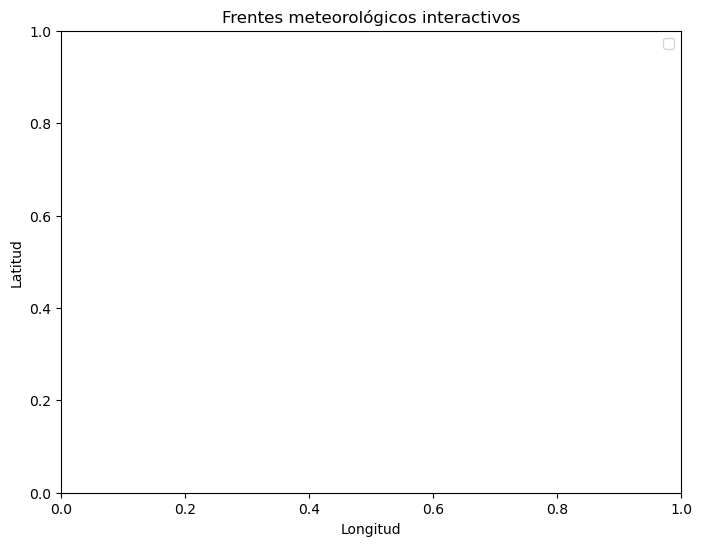

In [231]:
from ipyleaflet import Map, DrawControl, Polyline, Marker, LayerGroup
from metpy.plots import StationPlot
import matplotlib.pyplot as plt
import geopandas as gpd
from IPython.display import display
from shapely.geometry import LineString

# Crear un mapa de ipyleaflet
m = Map(center=(25, -115), zoom=4)

# Capa para guardar los frentes y marcadores
frente_layer = LayerGroup()

# Agregar la capa al mapa
m.add_layer(frente_layer)

# Control de dibujo para interactuar con el mapa
draw = DrawControl()

# Colores para los diferentes tipos de frentes
colores_frentes = {
    "frio": "blue",
    "calido": "red",
    "ocluido": "purple"
}

# Almacenar las coordenadas del frente
coordenadas_frentes = []

# Función que se ejecuta al hacer clic y dibujar
def handle_draw(self, action, geo_json):
    global coordenadas_frentes
    
    # Obtén el tipo de geometría (línea, punto, etc.)
    geometry = geo_json['geometry']
    
    # Si es una línea (frente)
    if geometry['type'] == 'LineString':
        coords = geometry['coordinates']
        linea = LineString(coords)
        gdf = gpd.GeoDataFrame(geometry=[linea], crs="EPSG:4326")
        
        # Pedir al usuario qué tipo de frente es
        tipo_frente = input("Ingresa el tipo de frente (frio, calido, ocluido): ").lower()
        
        # Dibujar la línea en el mapa con el color adecuado
        polyline = Polyline(locations=coords, color=colores_frentes.get(tipo_frente, "black"), fill=False)
        frente_layer.add_layer(polyline)
        
        # Agregar las coordenadas al historial
        coordenadas_frentes.append({
            "tipo": tipo_frente,
            "coords": coords
        })
        
        print(f"Frente {tipo_frente} dibujado con {len(coords)} puntos.")
    
    # Si es un punto, agregarlo como marcador
    elif geometry['type'] == 'Point':
        coord = geometry['coordinates']
        marker = Marker(location=(coord[1], coord[0]))
        frente_layer.add_layer(marker)
        print(f"Marcador añadido en {coord}.")

# Asignar el manejador de eventos
draw.on_draw(handle_draw)

# Añadir el control de dibujo al mapa
m.add_control(draw)

# Mostrar el mapa
display(m)

# Visualizar los frentes interactivos
def mostrar_frentes():
    plt.figure(figsize=(8, 6))
    
    for frente in coordenadas_frentes:
        coords = frente["coords"]
        tipo = frente["tipo"]
        
        # Convertir coordenadas a formato de listas de latitudes y longitudes
        lats = [coord[1] for coord in coords]
        lons = [coord[0] for coord in coords]
        
        # Dibujar usando las herramientas de MetPy
        if tipo == "frio":
            plt.plot(lons, lats, color="blue", marker="o", label="Frente frío")
        elif tipo == "calido":
            plt.plot(lons, lats, color="red", marker="o", label="Frente cálido")
        elif tipo == "ocluido":
            plt.plot(lons, lats, color="purple", marker="o", label="Frente ocluido")
    
    plt.legend()
    plt.title("Frentes meteorológicos interactivos")
    plt.xlabel("Longitud")
    plt.ylabel("Latitud")
    plt.show()

# Llamar a la función después de dibujar para ver los frentes en un gráfico de Matplotlib
mostrar_frentes()


In [92]:
import leafmap
from ipyleaflet import ImageOverlay, LayersControl

# Crear el mapa centrado en las coordenadas adecuadas
m = leafmap.Map(center=[22.375, 285.125], zoom=2)

# Ruta a la imagen
image_path = "files/http://localhost:8888/lab/tree/csd_2024/Carta_sinoptica_20241014_1425HLC.png"

# Definir los límites geográficos de la imagen
bounds = [[-22.00, 256.55], [48.25, 365.25]]

# Añadir la imagen al mapa con los límites especificados
image_overlay = ImageOverlay(
    url=image_path,
    bounds=bounds,
    opacity=0.3
)
m.add_layer(image_overlay)

# Añadir control de capas
m.add_control(LayersControl())

# Mostrar el mapa interactivo
m


Map(center=[22.375, 285.125], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoo…

In [72]:
from ipyleaflet import Map, LocalTileLayer

m = Map(center=(4, -74), zoom=3)
m.add(LocalTileLayer(path='Carta_sinoptica_20241014_1425HLC.jpg'))

m

C:/Users/acercompu/OneDrive - Ideam/Mi unidad/OSPA/04. Administrativo/02. Contratistas/11. ALEXANDER_MARTINEZ/Contrato_324_2024/csd_2024/Carta_sinoptica_20241014_1425HLC.jpg

Map(center=[4, -74], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_tex…

In [195]:
import leafmap
from ipyleaflet import ImageOverlay, LayersControl

# Crear el mapa centrado en las coordenadas adecuadas
m = leafmap.Map(center=[22.375, 285.125], zoom=2)

# Ruta a la imagen
image_path = "Carta_sinoptica_20241014_1425HLC.jpg"

# Definir los límites geográficos de la imagen
bounds = [[-22.00, 256.55], [48.25, 365.25]]

# Añadir la imagen al mapa con los límites especificados
image_overlay = ImageOverlay(
    url=image_path,
    bounds=bounds,
    opacity=0.3
)
m.add_layer(image_overlay)

# Añadir control de capas
m.add_control(LayersControl())

# Mostrar el mapa interactivo
m


Map(center=[22.375, 285.125], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoo…

In [5]:
import os
import leafmap

# Configura la variable de entorno PROJ_LIB
os.environ['PROJ_LIB'] = r'C:/Users/acercompu/anaconda3/envs/csd_2024/Library/share/proj'

# Crea el mapa interactivo
m = leafmap.Map(layers_control=True)

# Añade el raster al mapa
tif = "wind_global.tif"
m.add_raster(tif, indexes=[1], palette="coolwarm", layer_name="u_wind")

# Muestra el mapa
m


Please restart Jupyter kernel after installation if you encounter any errors when importing leafmap.


Exception: expected string or bytes-like object, got 'NoneType'

In [ ]:
import os
import leafmap

# Configura la variable de entorno PROJ_LIB
os.environ['PROJ_LIB'] = r'C:/path/to/your/conda/envs/csd_2024/Library/share/proj'

# Crea el mapa interactivo
m = leafmap.Map(layers_control=True)

# Añade el raster al mapa
tif = "wind_global.tif"
m.add_raster(tif, indexes=[1], palette="coolwarm", layer_name="u_wind")

# Muestra el mapa
m


In [3]:
import os

# Encuentra la ruta del entorno conda actual
conda_env_path = os.environ.get('CONDA_PREFIX')

if conda_env_path:
    # Construye la ruta a la carpeta PROJ_LIB
    proj_lib_path = os.path.join(conda_env_path, 'Library', 'share', 'proj')
    
    # Verifica si la carpeta existe
    if os.path.exists(proj_lib_path):
        print(f"La carpeta PROJ_LIB está ubicada en: {proj_lib_path}")
        os.environ['PROJ_LIB'] = proj_lib_path
    else:
        print("La carpeta PROJ_LIB no se encontró en el entorno conda.")
else:
    print("No se pudo encontrar la variable de entorno CONDA_PREFIX.")


La carpeta PROJ_LIB está ubicada en: C:\Users\acercompu\anaconda3\envs\csd_2024\Library\share\proj


In [2]:
pwd

'C:\\Users\\acercompu\\OneDrive - Ideam\\Mi unidad\\OSPA\\04. Administrativo\\02. Contratistas\\11. ALEXANDER_MARTINEZ\\Contrato_324_2024\\csd_2024'

In [4]:
# Encuentra la ruta del entorno conda actual
conda_env_path = os.environ.get('CONDA_PREFIX')

if conda_env_path:
    # Construye la ruta a la carpeta PROJ_LIB
    proj_lib_path = os.path.join(conda_env_path, 'Library', 'share', 'proj')
    
    # Verifica si la carpeta existe
    if os.path.exists(proj_lib_path):
        print(f"La carpeta PROJ_LIB está ubicada en: {proj_lib_path}")
    else:
        print("La carpeta PROJ_LIB no se encontró en el entorno conda.")
else:
    print("No se pudo encontrar la variable de entorno CONDA_PREFIX.")


La carpeta PROJ_LIB está ubicada en: C:\Users\acercompu\anaconda3\envs\csd_2024\Library\share\proj


In [5]:
# Configura la variable de entorno PROJ_LIB
os.environ['PROJ_LIB'] = r'C:/Users/acercompu/anaconda3/envs/csd_2024/Library/share/proj'

import leafmap

# Crea el mapa interactivo
m = leafmap.Map(layers_control=True)

# Añade el raster al mapa
tif = "wind_global.tif"
m.add_raster(tif, indexes=[1], palette="coolwarm", layer_name="u_wind")

# Muestra el mapa
m


Please restart Jupyter kernel after installation if you encounter any errors when importing leafmap.


Exception: expected string or bytes-like object, got 'NoneType'

In [3]:
import os

In [5]:
import rioxarray

In [4]:
import netCDF4
import h5netcdf
from leafmap import leafmap
import leafmap.foliumap as leafmap
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import matplotlib.pyplot as plt
# import geemap

In [29]:
tif_path = r"C:/Users/acercompu/OneDrive - Ideam/Mi unidad/OSPA/04. Administrativo/02. Contratistas/11. ALEXANDER_MARTINEZ/Contrato_324_2024/carta_sinoptica_dinamica_2024/"

In [30]:
# Crear un objeto de mapa
m = leafmap.Map()
m

In [31]:
# Ruta del archivo .tif
tif_path = r"C:/Users/acercompu/OneDrive - Ideam/Mi unidad/OSPA/04. Administrativo/02. Contratistas/11. ALEXANDER_MARTINEZ/Contrato_324_2024/carta_sinoptica_dinamica_2024/precipitable_water.tif"

Archivo GeoTIFF cargado correctamente
Dimensiones: 601 x 381
Número de bandas: 1
Esquema de coordenadas (CRS): EPSG:4326
Transformación (georreferenciación): | 0.25, 0.00, 210.00|
| 0.00,-0.25, 70.00|
| 0.00, 0.00, 1.00|


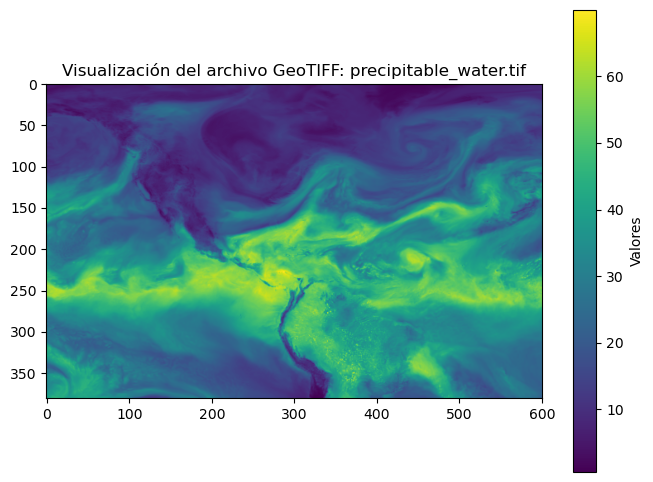

In [32]:
try:
    with rasterio.open(tif_path) as dataset:
        # Mostrar información del archivo
        print("Archivo GeoTIFF cargado correctamente")
        print(f"Dimensiones: {dataset.width} x {dataset.height}")
        print(f"Número de bandas: {dataset.count}")
        print(f"Esquema de coordenadas (CRS): {dataset.crs}")
        print(f"Transformación (georreferenciación): {dataset.transform}")

        # Leer la primera banda del archivo
        band1 = dataset.read(1)

        # Crear la figura y los ejes
        fig, ax = plt.subplots(figsize=(8, 6))

        # Mostrar la banda 1 del GeoTIFF
        cax = ax.imshow(band1, cmap='viridis')
        fig.colorbar(cax, ax=ax, orientation='vertical', label='Valores')

        # Añadir un título
        ax.set_title('Visualización del archivo GeoTIFF: precipitable_water.tif')

        # Mostrar el gráfico
        plt.show()

except Exception as e:
    print(f"Error al abrir o visualizar el archivo GeoTIFF: {e}")


In [21]:
# Ruta del archivo .tif
tif_path_2 = r"C:/Users/acercompu/OneDrive - Ideam/Mi unidad/OSPA/04. Administrativo/02. Contratistas/11. ALEXANDER_MARTINEZ/Contrato_324_2024/csd_2024/reprojected_precipitable_water.tif"

Archivo GeoTIFF cargado correctamente
Dimensiones: 601 x 381
Número de bandas: 1
Esquema de coordenadas (CRS): EPSG:4326
Transformación (georreferenciación): | 0.25, 0.00, 210.00|
| 0.00,-0.25, 70.00|
| 0.00, 0.00, 1.00|


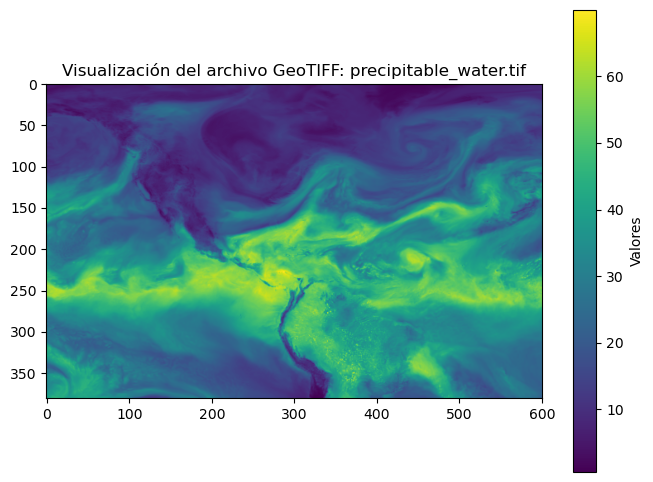

In [22]:
try:
    with rasterio.open(tif_path_2) as dataset:
        # Mostrar información del archivo
        print("Archivo GeoTIFF cargado correctamente")
        print(f"Dimensiones: {dataset.width} x {dataset.height}")
        print(f"Número de bandas: {dataset.count}")
        print(f"Esquema de coordenadas (CRS): {dataset.crs}")
        print(f"Transformación (georreferenciación): {dataset.transform}")

        # Leer la primera banda del archivo
        band1 = dataset.read(1)

        # Crear la figura y los ejes
        fig, ax = plt.subplots(figsize=(8, 6))

        # Mostrar la banda 1 del GeoTIFF
        cax = ax.imshow(band1, cmap='viridis')
        fig.colorbar(cax, ax=ax, orientation='vertical', label='Valores')

        # Añadir un título
        ax.set_title('Visualización del archivo GeoTIFF: precipitable_water.tif')

        # Mostrar el gráfico
        plt.show()

except Exception as e:
    print(f"Error al abrir o visualizar el archivo GeoTIFF: {e}")


In [33]:
# Añadir el archivo GeoTIFF al mapa
m.add_raster(tif_path, layer_name="precipitable_water")

ImportError: localtileserver is not installed. Please install it before proceeding. https://github.com/banesullivan/localtileserver

In [5]:
m = leafmap.Map(layers_control= True)
m.add_raster(tif, indexes=[1], palette="coolwarm")

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [34]:
m.add_raster(tif_path, indexes=[1], palette="coolwarm", layer_name="u_wind")

ImportError: localtileserver is not installed. Please install it before proceeding. https://github.com/banesullivan/localtileserver

In [2]:
import rasterio

In [6]:
# Ruta del archivo .tif
tif_path = r"C:/Users/acercompu/OneDrive - Ideam/Mi unidad/OSPA/04. Administrativo/02. Contratistas/11. ALEXANDER_MARTINEZ/Contrato_324_2024/carta_sinoptica_dinamica_2024/precipitable_water.tif"


In [7]:
# Intentar abrir el archivo GeoTIFF
try:
    with rasterio.open(tif_path) as dataset:
        # Mostrar información del archivo
        print("Archivo GeoTIFF cargado correctamente")
        print(f"Dimensiones: {dataset.width} x {dataset.height}")
        print(f"Número de bandas: {dataset.count}")
        print(f"Esquema de coordenadas (CRS): {dataset.crs}")
        print(f"Transformación (georreferenciación): {dataset.transform}")
except Exception as e:
    print(f"Error al abrir el archivo GeoTIFF: {e}")

Archivo GeoTIFF cargado correctamente
Dimensiones: 601 x 381
Número de bandas: 1
Esquema de coordenadas (CRS): EPSG:4326
Transformación (georreferenciación): | 0.25, 0.00, 210.00|
| 0.00,-0.25, 70.00|
| 0.00, 0.00, 1.00|


In [2]:
import matplotlib.pyplot as plt

Archivo GeoTIFF cargado correctamente
Dimensiones: 601 x 381
Número de bandas: 1
Esquema de coordenadas (CRS): EPSG:4326
Transformación (georreferenciación): | 0.25, 0.00, 210.00|
| 0.00,-0.25, 70.00|
| 0.00, 0.00, 1.00|


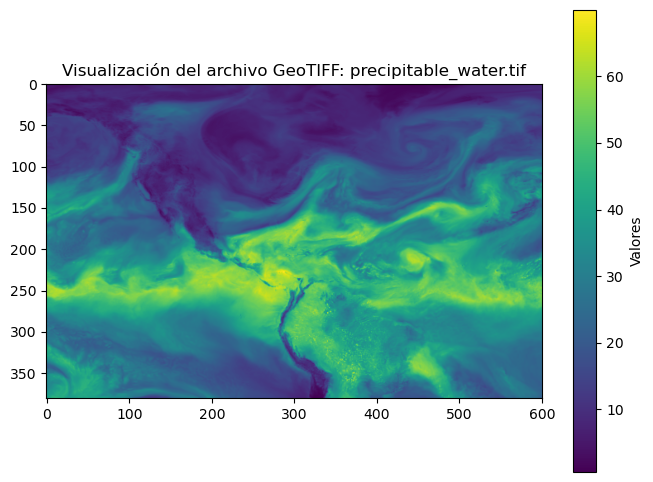

In [9]:
# Intentar abrir el archivo GeoTIFF y visualizarlo
try:
    with rasterio.open(tif_path) as dataset:
        # Mostrar información del archivo
        print("Archivo GeoTIFF cargado correctamente")
        print(f"Dimensiones: {dataset.width} x {dataset.height}")
        print(f"Número de bandas: {dataset.count}")
        print(f"Esquema de coordenadas (CRS): {dataset.crs}")
        print(f"Transformación (georreferenciación): {dataset.transform}")

        # Leer la primera banda del archivo
        band1 = dataset.read(1)

        # Crear la figura y los ejes
        fig, ax = plt.subplots(figsize=(8, 6))

        # Mostrar la banda 1 del GeoTIFF
        cax = ax.imshow(band1, cmap='viridis')
        fig.colorbar(cax, ax=ax, orientation='vertical', label='Valores')

        # Añadir un título
        ax.set_title('Visualización del archivo GeoTIFF: precipitable_water.tif')

        # Mostrar el gráfico
        plt.show()

except Exception as e:
    print(f"Error al abrir o visualizar el archivo GeoTIFF: {e}")


In [6]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import leafmap

Please restart Jupyter kernel after installation if you encounter any errors when importing leafmap.


Exception: expected string or bytes-like object, got 'NoneType'

In [11]:
# Ruta del archivo .tif
tif_path = r"C:/Users/acercompu/OneDrive - Ideam/Mi unidad/OSPA/04. Administrativo/02. Contratistas/11. ALEXANDER_MARTINEZ/Contrato_324_2024/carta_sinoptica_dinamica_2024/precipitable_water.tif"
reprojected_tif_path = "reprojected_precipitable_water.tif"


In [12]:

# Reproyectar el archivo GeoTIFF al rango [-180, 180] y EPSG:4326
with rasterio.open(tif_path) as src:
    # Definir la proyección de destino como EPSG:4326 (WGS84)
    dst_crs = 'EPSG:4326'

    # Calcular la transformación para la re-proyección
    transform, width, height = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds
    )

    # Crear un perfil actualizado para la re-proyección
    profile = src.profile
    profile.update({
        'crs': dst_crs,
        'transform': transform,
        'width': width,
        'height': height
    })

    # Reproyectar y guardar en un nuevo archivo
    with rasterio.open(reprojected_tif_path, 'w', **profile) as dst:
        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(dst, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.nearest
            )

print(f"Archivo reproyectado guardado en {reprojected_tif_path}")

Archivo reproyectado guardado en reprojected_precipitable_water.tif


ImportError: localtileserver is not installed. Please install it before proceeding. https://github.com/banesullivan/localtileserver

In [15]:
# Ahora visualizar en leafmap
# Crear el mapa
m = leafmap.Map(center=(0, 0), zoom=2)

# Añadir el archivo reproyectado al mapa
m.add_raster(reprojected_tif_path, layer_name="Reprojected Precipitable Water")

# Mostrar el mapa
m


ImportError: localtileserver is not installed. Please install it before proceeding. https://github.com/banesullivan/localtileserver

In [4]:
m = geemap.Map()
m

Enter verification code:  4/1AVG7fiT4MvHNKRzyXEMbCA667Nve0XKu7PXGL8iqRrimU-1Z5tcMIdXIFio



Successfully saved authorization token.


Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(childr…

In [4]:
import ee
import folium

In [8]:


# Inicializar el módulo de Earth Engine.
ee.Initialize()

# Definir una función para añadir una capa de Google Earth Engine al mapa.
def add_ee_layer(self, ee_object, vis_params, name):
    try:
        # Mostrar una imagen
        if isinstance(ee_object, ee.image.Image):
            map_id_dict = ee_object.getMapId(vis_params)
            folium.raster_layers.TileLayer(
                tiles=map_id_dict['tile_fetcher'].url_format,
                attr='Google Earth Engine',
                name=name,
                overlay=True,
                control=True
            ).add_to(self)
        # Mostrar una colección de imágenes
        elif isinstance(ee_object, ee.imagecollection.ImageCollection):
            ee_object_new = ee_object.mosaic()
            map_id_dict = ee_object_new.getMapId(vis_params)
            folium.raster_layers.TileLayer(
                tiles=map_id_dict['tile_fetcher'].url_format,
                attr='Google Earth Engine',
                name=name,
                overlay=True,
                control=True
            ).add_to(self)
        # Mostrar una colección de características
        elif isinstance(ee_object, ee.featurecollection.FeatureCollection):
            ee_object_new = ee_object.style(**vis_params)
            map_id_dict = ee_object_new.getMapId()
            folium.raster_layers.TileLayer(
                tiles=map_id_dict['tile_fetcher'].url_format,
                attr='Google Earth Engine',
                name=name,
                overlay=True,
                control=True
            ).add_to(self)
    except Exception as e:
        print(f"Could not display {name}: {e}")

# Añadir el método de dibujo de EE a folium.
folium.Map.add_ee_layer = add_ee_layer

# Crear un objeto de mapa de folium.
Map = folium.Map(location=[0, 0], zoom_start=2)

# Cargar la imagen en color verdadero de GOES-16.
goes16 = ee.ImageCollection('NOAA/GOES/16/MCMIPF').filterDate('2024-10-16', '2024-10-17').select(['CMI_C02', 'CMI_C03', 'CMI_C01']).median()

# Definir los parámetros de visualización.
vis_params = {
    'bands': ['CMI_C02', 'CMI_C03', 'CMI_C01'],
    'min': 0.0,
    'max': 0.8,
    'gamma': 1.4
}

# Añadir la imagen en color verdadero de GOES-16 al mapa.
Map.add_ee_layer(goes16, vis_params, 'GOES-16 True Color')

# Añadir un panel de control de capas al mapa.
Map.add_child(folium.LayerControl())

# Mostrar el mapa.
Map


In [ ]:
4/1AVG7fiTd3BbiplaCdva25hqWWS1FUclpAFfXID3qolJzVCWAMekDsUkFdrg
4/1AVG7fiT4MvHNKRzyXEMbCA667Nve0XKu7PXGL8iqRrimU-1Z5tcMIdXIFio

In [23]:
import ee
import folium

In [15]:


# Inicializar el módulo de Earth Engine.
ee.Initialize()

# Aplica factores de escala y offset.
def apply_scale_and_offset(img):
    def get_factor_img(factor_names):
        factor_list = img.toDictionary().select(factor_names).values()
        return ee.Image.constant(factor_list)
    
    scale_img = get_factor_img(['CMI_C.._scale'])
    offset_img = get_factor_img(['CMI_C.._offset'])
    scaled = img.select('CMI_C..').multiply(scale_img).add(offset_img)
    return img.addBands(scaled, overwrite=True)

# Añade una banda sintética verde.
def add_green_band(img):
    green = img.expression(
        '0.45 * red + 0.10 * nir + 0.45 * blue',
        {
            'blue': img.select('CMI_C01'),
            'red': img.select('CMI_C02'),
            'nir': img.select('CMI_C03')
        }
    ).rename('CMI_GREEN')
    return img.addBands(green)

# Escala bandas seleccionadas para visualización.
def scale_for_vis(img):
    return img.select(['CMI_C01', 'CMI_GREEN', 'CMI_C02', 'CMI_C03', 'CMI_C05']) /
              .resample('bicubic') /
              .log10() /
              .interpolate([-1.6, 0.176], [0, 1], 'clamp') /
              .unmask(0) /
              .set('system:time_start', img.get('system:time_start'))

# Envuelve las funciones anteriores.
def process_for_vis(img):
    return scale_for_vis(add_green_band(apply_scale_and_offset(img)))

# Filtrar la colección para obtener imágenes de tipo "fulldisk".
goes16 = ee.ImageCollection('NOAA/GOES/16/MCMIPF').filter(ee.Filter.eq('scan_mode', 'FULLDISK')).first()

# Aplicar la proyección Plate Carrée.
goes16 = goes16.reproject(crs='EPSG:4326', scale=1000)

# Procesar la imagen.
processed_image = process_for_vis(goes16)

# Definir una función para añadir una capa de Google Earth Engine al mapa.
def add_ee_layer(self, ee_object, vis_params, name):
    try:
        # Mostrar una imagen
        if isinstance(ee_object, ee.image.Image):
            map_id_dict = ee_object.getMapId(vis_params)
            folium.raster_layers.TileLayer(
                tiles=map_id_dict['tile_fetcher'].url_format,
                attr='Google Earth Engine',
                name=name,
                overlay=True,
                control=True
            ).add_to(self)
        # Mostrar una colección de imágenes
        elif isinstance(ee_object, ee.imagecollection.ImageCollection):
            ee_object_new = ee_object.mosaic()
            map_id_dict = ee_object_new.getMapId(vis_params)
            folium.raster_layers.TileLayer(
                tiles=map_id_dict['tile_fetcher'].url_format,
                attr='Google Earth Engine',
                name=name,
                overlay=True,
                control=True
            ).add_to(self)
        # Mostrar una colección de características
        elif isinstance(ee_object, ee.featurecollection.FeatureCollection):
            ee_object_new = ee_object.style(**vis_params)
            map_id_dict = ee_object_new.getMapId()
            folium.raster_layers.TileLayer(
                tiles=map_id_dict['tile_fetcher'].url_format,
                attr='Google Earth Engine',
                name=name,
                overlay=True,
                control=True
            ).add_to(self)
    except Exception as e:
        print(f"Could not display {name}: {e}")

# Añadir el método de dibujo de EE a folium.
folium.Map.add_ee_layer = add_ee_layer

# Crear un objeto de mapa de folium.
Map = folium.Map(location=[0, 0], zoom_start=2)

# Definir los parámetros de visualización.
vis_params = {
    'bands': ['CMI_C01', 'CMI_GREEN', 'CMI_C02'],
    'min': 0.0,
    'max': 1.0,
    'gamma': 1.4
}

# Añadir la imagen procesada al mapa.
Map.add_ee_layer(processed_image, vis_params, 'GOES-16 True Color Processed')

# Añadir un panel de control de capas al mapa.
Map.add_child(folium.LayerControl())

# Mostrar el mapa.
Map


Could not display GOES-16 True Color Processed: Image.reproject: Parameter 'image' is required.


In [4]:
import os

# Instalar netCDF4 y h5netcdf en el entorno csd_2024 usando conda-forge
os.system('conda install -n csd_2024 -c conda-forge netCDF4 h5netcdf -y')

print("Las librerías netCDF4 y h5netcdf han sido instaladas en el entorno csd_2024 usando conda-forge.")



Las librerías netCDF4 y h5netcdf han sido instaladas en el entorno csd_2024 usando conda-forge.


In [6]:
url = "https://github.com/opengeos/datasets/releases/download/raster/wind_global.nc"
filename = "wind_global.nc"

In [7]:
leafmap.download_file(url, output=filename, overwrite=True)

Downloading...
From: https://github.com/opengeos/datasets/releases/download/raster/wind_global.nc
To: C:\Users\acercompu\OneDrive - Ideam\Mi unidad\OSPA\04. Administrativo\02. Contratistas\11. ALEXANDER_MARTINEZ\Contrato_324_2024\csd_2024\wind_global.nc
100%|████████████████████████████████████████████████████████████| 1.05M/1.05M [00:00<00:00, 9.51MB/s]


'C:\\Users\\acercompu\\OneDrive - Ideam\\Mi unidad\\OSPA\\04. Administrativo\\02. Contratistas\\11. ALEXANDER_MARTINEZ\\Contrato_324_2024\\csd_2024\\wind_global.nc'

In [8]:
filename

'wind_global.nc'

In [9]:
pwd

'C:\\Users\\acercompu\\OneDrive - Ideam\\Mi unidad\\OSPA\\04. Administrativo\\02. Contratistas\\11. ALEXANDER_MARTINEZ\\Contrato_324_2024\\csd_2024'

In [10]:
data = leafmap.read_netcdf(filename)
data

<xarray.Dataset> Size: 1MB
Dimensions:  (lat: 181, lon: 360)
Coordinates:
  * lat      (lat) float64 1kB 90.0 89.0 88.0 87.0 ... -87.0 -88.0 -89.0 -90.0
  * lon      (lon) float64 3kB 0.0 1.0 2.0 3.0 4.0 ... 356.0 357.0 358.0 359.0
Data variables:
    u_wind   (lat, lon) float64 521kB ...
    v_wind   (lat, lon) float64 521kB ...
Attributes:
    centerName:      US National Weather Service - NCEP(WMC)
    disciplineName:  Meteorological products
    refTime:         2016-04-30T06:00:00.000Z

In [11]:
tif = "wind_global.tif"
leafmap.netcdf_to_tif(filename, tif, variables=["u_wind", "v_wind"], shift_lon=True)

'C:\\Users\\acercompu\\OneDrive - Ideam\\Mi unidad\\OSPA\\04. Administrativo\\02. Contratistas\\11. ALEXANDER_MARTINEZ\\Contrato_324_2024\\csd_2024\\wind_global.tif'

In [12]:
geojson = (
    "https://github.com/opengeos/leafmap/raw/master/examples/data/countries.geojson"
)

In [13]:
m = leafmap.Map(layers_control=True)
m.add_raster(tif, indexes=[1], palette="coolwarm", layer_name="u_wind")
m.add_geojson(geojson, layer_name="Countries")
m

In [14]:
m = leafmap.Map(layers_control=True)
m.add_netcdf(
    filename,
    variables=["v_wind"],
    palette="coolwarm",
    shift_lon=True,
    layer_name="v_wind",
    indexes=[1],
)
m.add_geojson(geojson, layer_name="Countries")
m

In [15]:
m = leafmap.Map(layers_control=True)
m.add_basemap("CartoDB.DarkMatter")
m.add_velocity(
    filename,
    zonal_speed="u_wind",
    meridional_speed="v_wind",
    color_scale=[
        "rgb(0,0,150)",
        "rgb(0,150,0)",
        "rgb(255,255,0)",
        "rgb(255,165,0)",
        "rgb(150,0,0)",
    ],
)
m

The folium plotting backend does not support this function.


In [16]:
import leafmap

# Usa ipyleaflet backend
m = leafmap.Map()

# Agrega un mapa base
m.add_basemap("CartoDB.DarkMatter")

# Añade la capa de velocidad
m.add_velocity(
    filename,
    zonal_speed="u_wind",
    meridional_speed="v_wind",
    color_scale=[
        "rgb(0,0,150)",
        "rgb(0,150,0)",
        "rgb(255,255,0)",
        "rgb(255,165,0)",
        "rgb(150,0,0)",
    ],
)

# Muestra el mapa
m


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [6]:
import rioxarray

In [7]:
with rasterio.open('wind_global.tif') as dataset:
    # Imprime las propiedades del dataset
    print("Propiedades del Dataset:")


Propiedades del Dataset:


In [10]:
data = dataset.read()

RasterioIOError: Dataset is closed: wind_global.tif

In [11]:
import rasterio

# Abre el archivo TIFF
with rasterio.open('wind_global.tif') as dataset:
    # Imprime las propiedades del dataset
    print("Propiedades del Dataset:")
    print("-----------------------")
    print(f"Driver: {dataset.driver}")
    print(f"Ancho: {dataset.width}")
    print(f"Alto: {dataset.height}")
    print(f"Cantidad de bandas: {dataset.count}")
    print(f"CRS: {dataset.crs}")
    print(f"Transformación: {dataset.transform}")
    
    # Lee los datos
    data = dataset.read()
    
    # Imprime las características de los datos
    print("/nCaracterísticas de los Datos:")
    print("----------------------------")
    print(f"Tipo de datos: {data.dtype}")
    print(f"Forma de los datos: {data.shape}")
    
    # Imprime las estadísticas de la primera banda
    band1 = data[0]
    print("/nEstadísticas de la Primera Banda:")
    print("-------------------------------")
    print(f"Mínimo: {band1.min()}")
    print(f"Máximo: {band1.max()}")
    print(f"Media: {band1.mean()}")


Propiedades del Dataset:
-----------------------
Driver: GTiff
Ancho: 360
Alto: 181
Cantidad de bandas: 2
CRS: EPSG:4326
Transformación: | 1.00, 0.00,-180.50|
| 0.00,-1.00, 90.50|
| 0.00, 0.00, 1.00|

Características de los Datos:
----------------------------
Tipo de datos: float64
Forma de los datos: (2, 181, 360)

Estadísticas de la Primera Banda:
-------------------------------
Mínimo: -21.61
Máximo: 25.61
Media: -0.04559039287906691


In [12]:
# import rasterio

# Abre el archivo TIFF
with rasterio.open('wind_global.tif') as dataset:
    # Obtiene el número de índices (bandas)
    num_indices = dataset.count

print(f"El archivo wind_global.tif tiene {num_indices} índices (bandas).")


El archivo wind_global.tif tiene 2 índices (bandas).


In [13]:
import rasterio

# Abre el archivo TIFF
with rasterio.open('wind_global.tif') as dataset:
    # Imprime los metadatos de cada banda
    for i in range(1, dataset.count + 1):
        print(f"Metadatos de la banda {i}:")
        print(dataset.tags(i))


Metadatos de la banda 1:
{}
Metadatos de la banda 2:
{}


In [14]:
import rasterio
import numpy as np

# Abre el archivo TIFF
with rasterio.open('wind_global.tif') as dataset:
    # Lee los datos de cada banda
    band1 = dataset.read(1)
    band2 = dataset.read(2)
    
    # Imprime estadísticas básicas de cada banda
    print("Estadísticas de la Banda 1 (u_wind):")
    print(f"Mínimo: {np.min(band1)}")
    print(f"Máximo: {np.max(band1)}")
    print(f"Media: {np.mean(band1)}")
    
    print("/nEstadísticas de la Banda 2 (v_wind):")
    print(f"Mínimo: {np.min(band2)}")
    print(f"Máximo: {np.max(band2)}")
    print(f"Media: {np.mean(band2)}")


Estadísticas de la Banda 1 (u_wind):
Mínimo: -21.61
Máximo: 25.61
Media: -0.04559039287906691

Estadísticas de la Banda 2 (v_wind):
Mínimo: -22.77
Máximo: 21.12
Media: 0.16869828115408222


In [18]:
m = leafmap.Map(layers_control=True)
m.add_raster(tif, indexes=[1], palette="coolwarm", layer_name="u_wind")
# m.add_geojson(geojson, layer_name="Countries")
m

ImportError: localtileserver is not installed. Please install it before proceeding. https://github.com/banesullivan/localtileserver

In [20]:
m = leafmap.Map(layers_control=True)
m.add_netcdf(
    filename,
    variables=["v_wind"],
    palette="coolwarm",
    shift_lon=True,
    layer_name="v_wind",
    indexes=[1],
)
# m.add_geojson(geojson, layer_name="Countries")
m

ImportError: localtileserver is not installed. Please install it before proceeding. https://github.com/banesullivan/localtileserver

In [1]:
import os

# Encuentra la ruta del entorno conda actual
conda_env_path = os.environ.get('CONDA_PREFIX')

if conda_env_path:
    # Construye la ruta a la carpeta PROJ_LIB
    proj_lib_path = os.path.join(conda_env_path, 'Library', 'share', 'proj')
    
    # Verifica si la carpeta existe
    if os.path.exists(proj_lib_path):
        print(f"La carpeta PROJ_LIB está ubicada en: {proj_lib_path}")
    else:
        print("La carpeta PROJ_LIB no se encontró en el entorno conda.")
else:
    print("No se pudo encontrar la variable de entorno CONDA_PREFIX.")


La carpeta PROJ_LIB está ubicada en: C:\Users\acercompu\anaconda3\envs\csd_2024\Library\share\proj


In [3]:
os.environ['PROJ_LIB'] = r'C:/Users/acercompu/anaconda3/envs/csd_2024/Library/share/proj'


In [ ]:
import os
import leafmap

# Configurar la variable de entorno PROJ_LIB
os.environ['PROJ_LIB'] = r'C:/Users/acercompu/anaconda3/envs/csd_2024/Library/share/proj'

# Crea el mapa interactivo
m = leafmap.Map(layers_control=True)

# Añade el raster al mapa
tif = "wind_global.tif"
m.add_raster(tif, indexes=[1], palette="coolwarm", layer_name="u_wind")

# Muestra el mapa
m


In [2]:
from ipyleaflet import Map, AntPath

In [3]:
m = Map(center=(52, 10), zoom=8)
m

Map(center=[52, 10], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_tex…

In [4]:
ant_paths = []

In [5]:
ant_paths.append(AntPath(locations=[[51.5, 8], [52.5, 12.1]], use="polyline"))
m += ant_paths[-1]

In [6]:
ant_paths.append(
    AntPath(
        locations=[[52, 8], [52.5, 8], [52.3, 9]],
        use="polygon",
        dash_array=[50, 100],
        weight=10,
        color="red",
    )
)
m += ant_paths[-1]

In [7]:
ant_paths.append(
    AntPath(
        locations=[[51.5, 11], [52, 12]],
        use="rectangle",
        dash_array=[10, 20],
        weight=5,
        color="white",
        pulse_color="green",
    )
)
m += ant_paths[-1]

In [8]:
ant_paths.append(
    AntPath(
        locations=[51.5, 10],
        radius=15000,
        use="circle",
        dash_array=[5, 10],
        weight=5,
        color="magenta",
    )
)
m += ant_paths[-1]

In [9]:
for ant_path in ant_paths:
    ant_path.reverse = True

In [10]:
for ant_path in ant_paths:
    ant_path.paused = True

In [26]:
from ipyleaflet import Map, GeoData
import geopandas
import numpy as np
import shapely

In [27]:
# Generate 100k random points around the world.

point_count = 100000

random_locs = np.array(
    [np.random.uniform(-90, 90, point_count), np.random.uniform(-180, 180, point_count)]
).transpose((1, 0))

In [28]:
m = Map(center=(48.1, 17.1), zoom=8, prefer_canvas=True)

gdf = geopandas.GeoDataFrame(
    geometry=[shapely.geometry.Point(loc) for loc in random_locs], crs="EPSG:4326"
)

geo_data = GeoData(
    geo_dataframe=gdf,
    hover_style={"fillColor": "red", "fillOpacity": 0.2},
    point_style={"radius": 5, "fillOpacity": 0.8, "fillColor": "blue", "weight": 3},
)

m.add(geo_data)
m

Map(center=[48.1, 17.1], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out…

In [30]:
from ipyleaflet import (
    Map,
    basemaps,
    basemap_to_tiles,
    Marker,
    TileLayer,
    WMSLayer,
    Polygon,
    GeoJSON,
    DrawControl,
    projections,
)


def handle_draw(target, action, geo_json):
    print(action, geo_json)


dc = DrawControl(marker={"shapeOptions": {"color": "#0000FF"}})
dc.on_draw(handle_draw)

# note that we need to use the same projection for the layer and the map.
m1 = Map(
    center=(90, 0),
    zoom=0,
    basemap=basemaps.NASAGIBS.BlueMarble3413,
    crs=projections.EPSG3413.NASAGIBS,
)
m1.add(dc)
m1

Map(center=[90, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [31]:
from ipyleaflet import (
    Map,
    Marker,
    TileLayer,
    ImageOverlay,
    Polyline,
    Polygon,
    Rectangle,
    Circle,
    CircleMarker,
    GeoJSON,
    DrawControl,
)

from traitlets import link

In [34]:
center = [34.6252978589571, -77.34580993652344]
zoom = 10

In [35]:
m = Map(center=center, zoom=zoom)
m

Map(center=[34.6252978589571, -77.34580993652344], controls=(ZoomControl(options=['position', 'zoom_in_text', …

In [36]:
m.zoom

8.0

In [37]:
dc = DrawControl(
    marker={"shapeOptions": {"color": "#0000FF"}},
    rectangle={"shapeOptions": {"color": "#0000FF"}},
    circle={"shapeOptions": {"color": "#0000FF"}},
    circlemarker={},
)


def handle_draw(target, action, geo_json):
    print(action)
    print(geo_json)


dc.on_draw(handle_draw)
m.add(dc)

Map(bottom=26242.0, center=[34.6252978589571, -77.34580993652344], controls=(ZoomControl(options=['position', …

In [38]:
dc.last_action

'created'

In [39]:
dc.last_draw

{'type': 'Feature',
 'properties': {'style': {'stroke': True,
   'color': '#3388ff',
   'weight': 4,
   'opacity': 0.5,
   'fill': False,
   'clickable': True}},
 'geometry': {'type': 'LineString',
  'coordinates': [[-78.175201, 34.581968],
   [-78.087311, 34.82132],
   [-77.840118, 34.600056],
   [-77.444611, 34.622661]]}}

In [40]:
dc.clear_circles()

In [41]:
dc.clear_polylines()

In [42]:
dc.clear_rectangles()

In [43]:
dc.clear_markers()

In [44]:
dc.clear_polygons()

In [45]:
dc.clear()

In [46]:
m2 = Map(center=center, zoom=zoom, layout=dict(width="600px", height="400px"))
m2

Map(center=[34.6252978589571, -77.34580993652344], controls=(ZoomControl(options=['position', 'zoom_in_text', …

In [47]:
map_center_link = link((m, "center"), (m2, "center"))
map_zoom_link = link((m, "zoom"), (m2, "zoom"))

In [48]:
new_poly = GeoJSON(data=dc.last_draw)

In [49]:
m2.add(new_poly)

Map(bottom=1014.0, center=[34.6252978589571, -77.34580993652344], controls=(ZoomControl(options=['position', '…

In [50]:
properties.style

NameError: name 'properties' is not defined

In [51]:
dc2 = DrawControl(
    polygon={"shapeOptions": {"color": "#0000FF"}},
    polyline={},
    circle={"shapeOptions": {"color": "#0000FF"}},
)
m2.add(dc2)

Map(bottom=413.0, center=[28.92163128242129, -80.15625000000001], controls=(ZoomControl(options=['position', '…

In [52]:
help DrawControl

SyntaxError: invalid syntax (1522693484.py, line 1)

In [53]:
help(DrawControl)

Help on class DrawControl in module ipyleaflet.leaflet:

class DrawControl(DrawControlBase)
 |  DrawControl(**kwargs)
 |  
 |  DrawControl class.
 |  
 |  Drawing tools for drawing on the map.
 |  
 |  Method resolution order:
 |      DrawControl
 |      DrawControlBase
 |      Control
 |      ipywidgets.widgets.widget.Widget
 |      ipywidgets.widgets.widget.LoggingHasTraits
 |      traitlets.traitlets.HasTraits
 |      traitlets.traitlets.HasDescriptors
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, **kwargs)
 |      Public constructor
 |  
 |  ----------------------------------------------------------------------
 |  Data descriptors defined here:
 |  
 |  circlemarker
 |  
 |  last_action
 |  
 |  last_draw
 |  
 |  polygon
 |  
 |  polyline
 |  
 |  ----------------------------------------------------------------------
 |  Data and other attributes defined here:
 |  
 |  __annotations__ = {}
 |  
 |  -------------------------------------------------

In [54]:
from ipyleaflet import Map, WMSLayer, basemaps

wms = WMSLayer(
    url='http://mesonet.agron.iastate.edu/cgi-bin/wms/nexrad/n0r.cgi',
    layers='nexrad-n0r-900913',
    format='image/png',
    transparent=True,
    attribution='Weather data © 2012 IEM Nexrad'
)

m = Map(basemap=basemaps.CartoDB.Positron, center=(38.491, -95.712), zoom=4)

m.add(wms)

m

Map(center=[38.491, -95.712], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoo…